In [1]:
%matplotlib notebook
from EIANN import *
from EIANN_utils import *
import matplotlib.pyplot as plt

In [2]:
input_size = 21
dataset = torch.eye(input_size)
target = torch.eye(dataset.shape[0])

epochs=300

Backprop w/static inhibition (softplus; Adam)

EIANN: appending a projection from Input E -> H1 E
EIANN: appending a projection from H1 FBI -> H1 E
EIANN: appending a projection from H1 E -> H1 FBI
EIANN: appending a projection from H1 E -> Output E
EIANN: appending a projection from Output FBI -> Output E
EIANN: appending a projection from Output E -> Output FBI


<IPython.core.display.Javascript object>


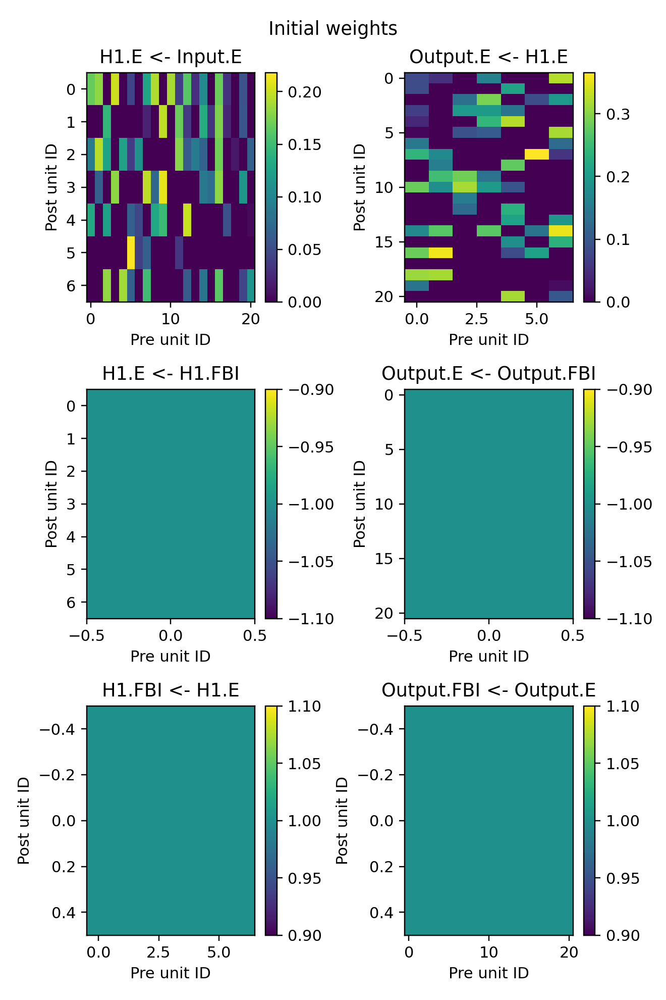

<IPython.core.display.Javascript object>


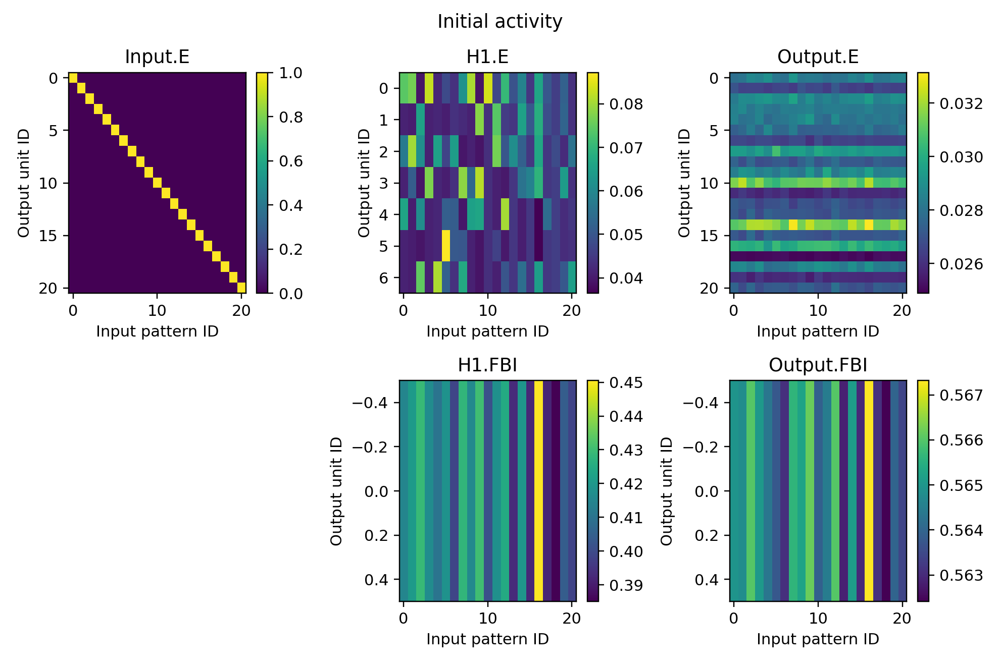

<IPython.core.display.Javascript object>


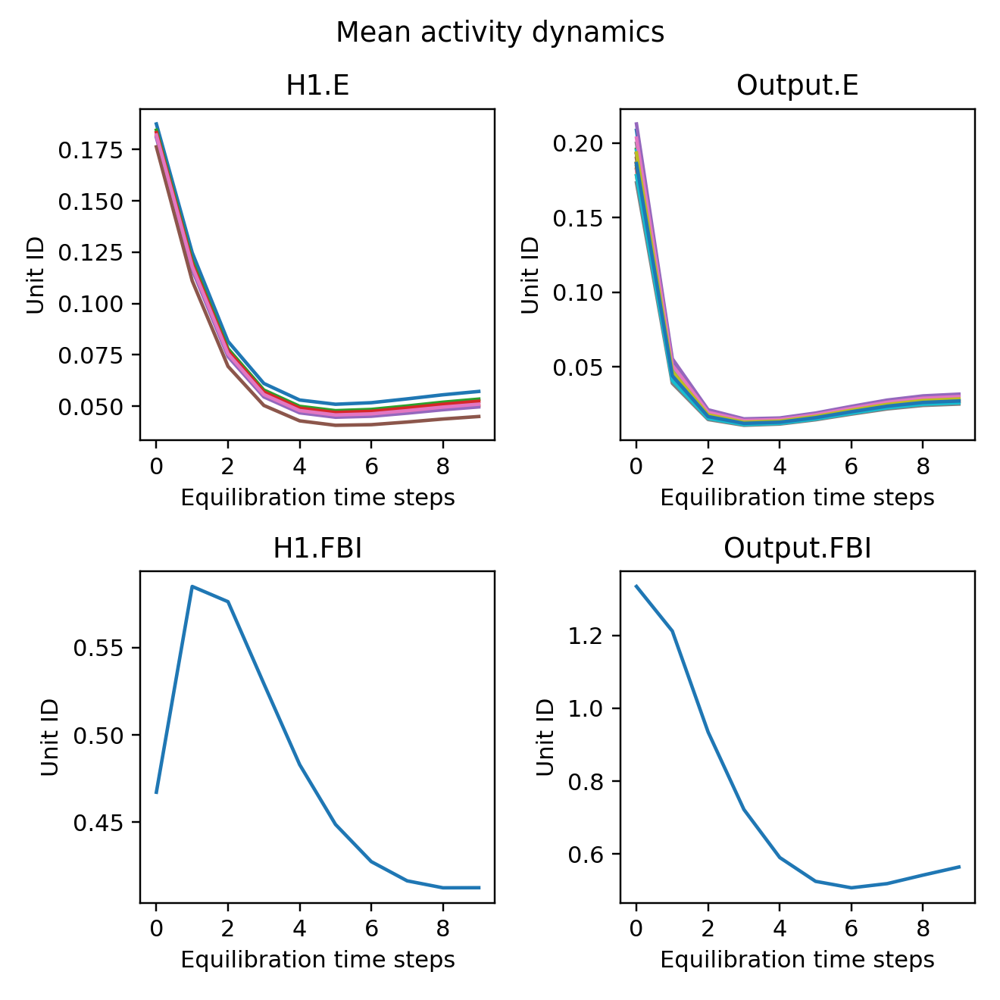

H1 E tensor([0., 0., 0., 0., 0., 0., 0.])
H1 FBI tensor([0.])
Output E tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Output FBI tensor([0.])


100%|██████████| 300/300 [00:15<00:00, 19.30it/s]


<IPython.core.display.Javascript object>


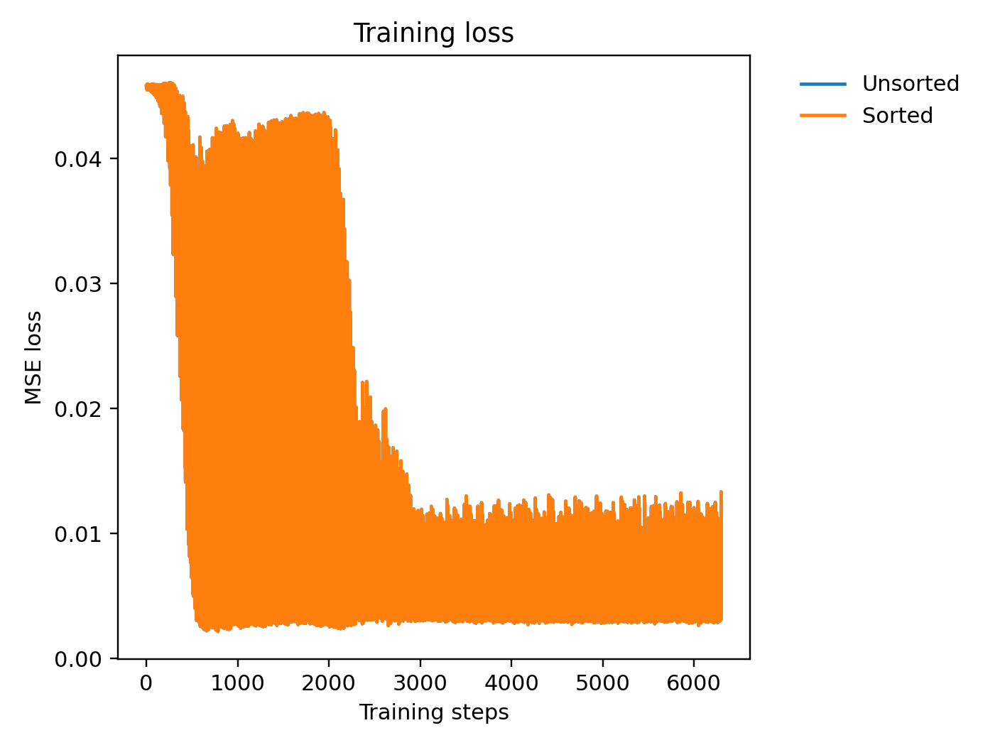

<IPython.core.display.Javascript object>


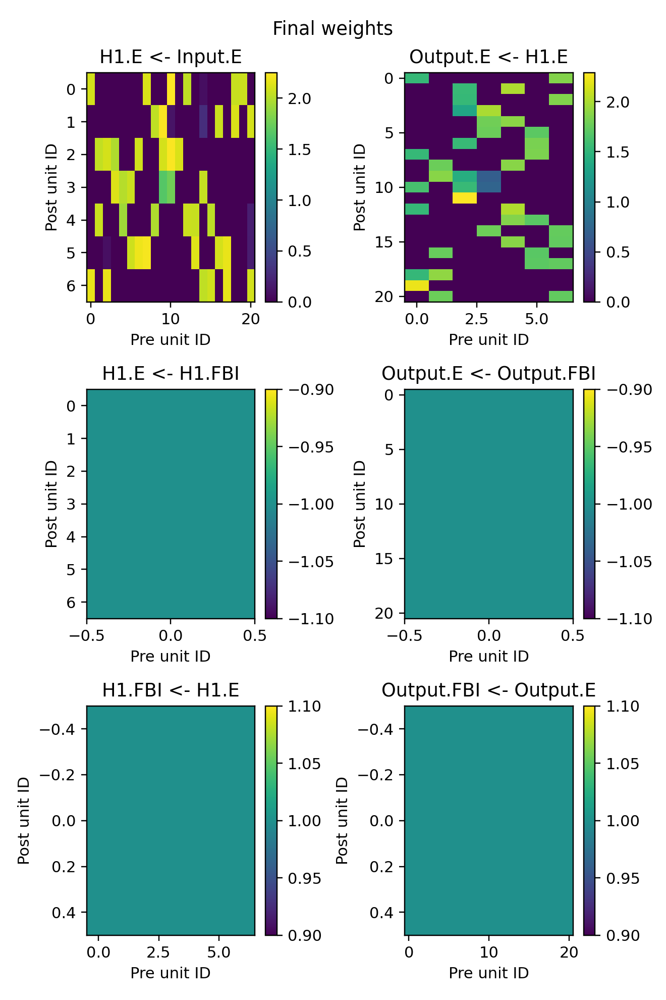

<IPython.core.display.Javascript object>


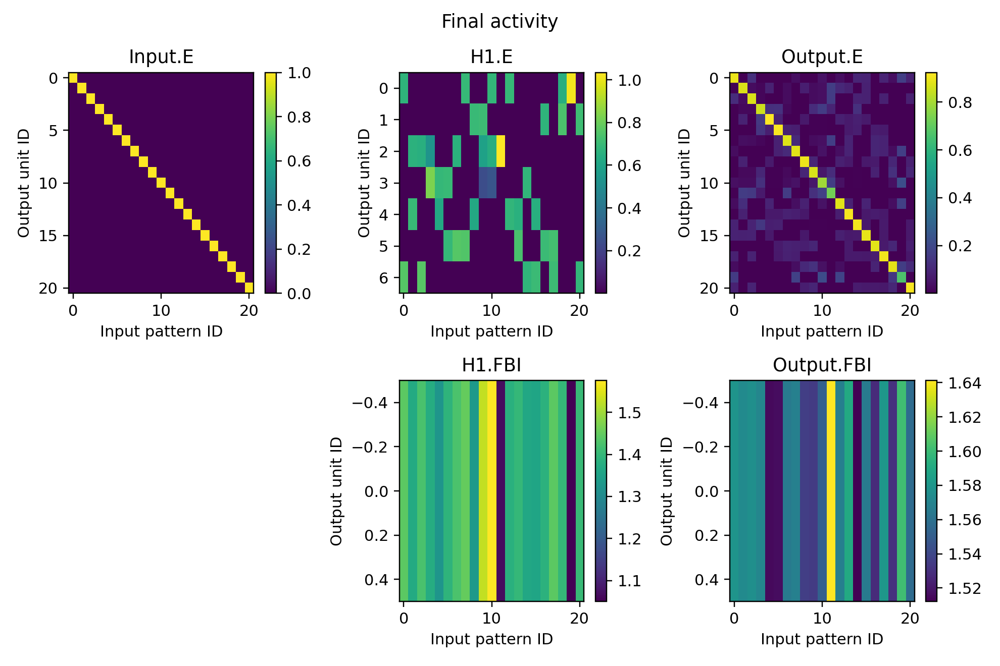

<IPython.core.display.Javascript object>


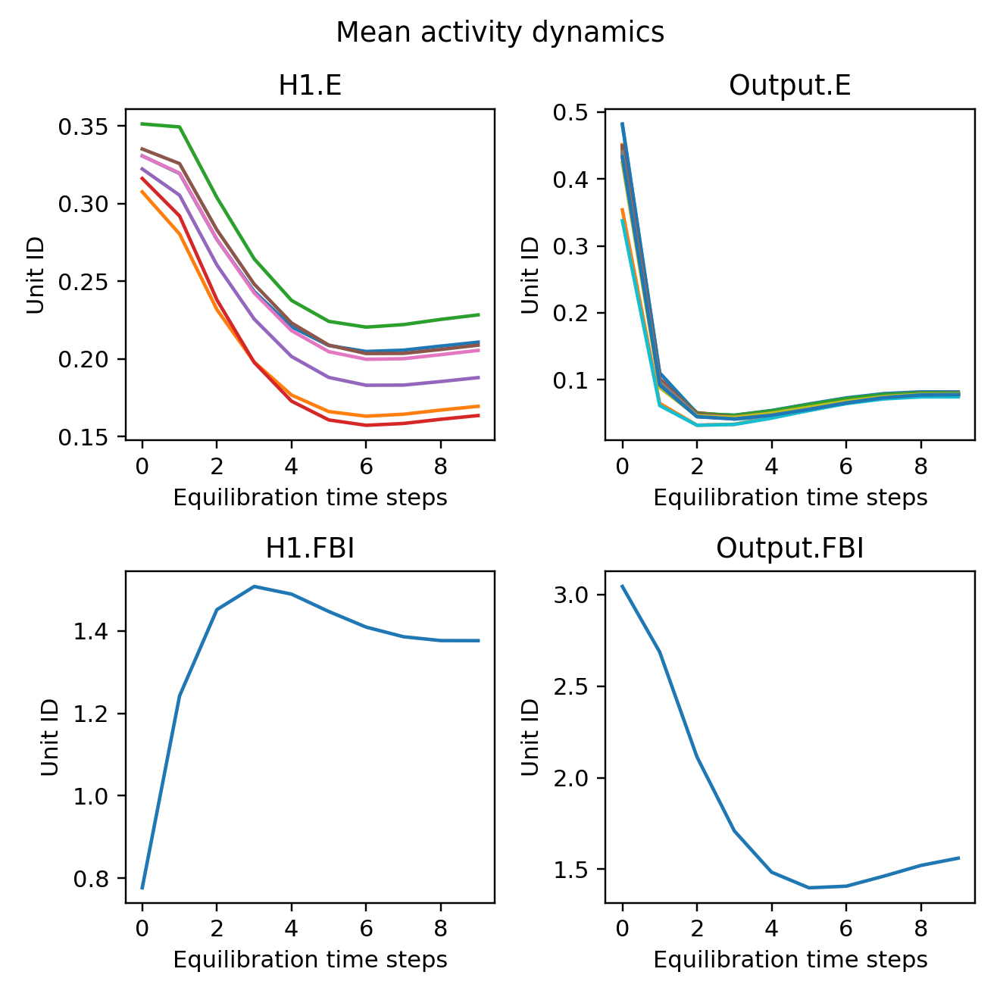

H1 E bias: tensor([0., 0., 0., 0., 0., 0., 0.])
H1 FBI bias: tensor([0.])
Output E bias: tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Output FBI bias: tensor([0.])


In [3]:
layer_config = {'Input': 
                    {'E': 
                         {'size': 21}
                    },
                'H1': 
                    {'E': 
                       {'size': 7, 
                        'activation': 'softplus', 
                        'activation_kwargs': 
                            {'beta': 4.}
                       },
                    'FBI': 
                        {'size': 1, 
                        'activation': 'softplus', 
                        'activation_kwargs': 
                            {'beta': 4.}
                        }
                    },
                'Output': 
                    {'E': 
                       {'size': 21, 
                        'activation': 'softplus', 
                        'activation_kwargs': 
                            {'beta': 4.}
                       },
                    'FBI': 
                        {'size': 1, 
                        'activation': 'softplus', 
                        'activation_kwargs': 
                            {'beta': 4.}
                        }
                    }
                 }

projection_config = {'H1':
                         {'E': 
                              {'Input': 
                                   {'E': 
                                        {'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'Backprop'
                                        }
                                   }, 
                               'H1': 
                                   {'FBI': 
                                        {'weight_init': 'fill_',
                                         'weight_init_args': (-1.,), 
                                         'direction': 'FB', 
                                         'learning_rule': None
                                        }
                                   }
                              },
                          'FBI': 
                              {'H1': 
                                   {'E': 
                                        {'weight_init': 'fill_',
                                         'weight_init_args': (1.,), 
                                         'direction': 'FF', 
                                         'learning_rule': None
                                        }
                                   }
                              }
                         },
                     'Output': 
                         {'E': 
                              {'H1': 
                                   {'E': 
                                        {'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'Backprop'
                                        }
                                   }, 
                               'Output': 
                                   {'FBI': 
                                        {'weight_init': 'fill_',
                                         'weight_init_args': (-1.,), 
                                         'direction': 'FB', 
                                         'learning_rule': None
                                        }
                                   }
                              },
                          'FBI': 
                              {'Output': 
                                   {'E': 
                                        {'weight_init': 'fill_',
                                         'weight_init_args': (1.,), 
                                         'direction': 'FF', 
                                         'learning_rule': None
                                        }
                                   }
                              }
                         }
                    }

hyperparameter_kwargs = {'tau': 3,
                         'forward_steps': 10,
                         'backward_steps': 2,
                         'learning_rate': 0.01,
                         'seed': 42,
                         'verbose': True
                        }

network = EIANN(layer_config, projection_config, **hyperparameter_kwargs, optimizer=Adam)
test_EIANN_config(network, dataset, target, epochs)

In [4]:
for layer in network:
    for population in layer:
        for projection in population:
            print(layer.name, population.name, projection.pre.layer.name, projection.pre.name)

print('pre layers:', network.Output.E.projections.keys())

print(network.Output.E.Output.FBI)
for name, projection in network.Output.E.Output.items():
    print(name, projection)

H1 E Input E
H1 E H1 FBI
H1 FBI H1 E
Output E H1 E
Output E Output FBI
Output FBI Output E
pre layers: dict_keys(['H1', 'Output'])
Linear(in_features=1, out_features=21, bias=False)
FBI Linear(in_features=1, out_features=21, bias=False)


Backprop w/static inhibition (relu; Adam)

<IPython.core.display.Javascript object>


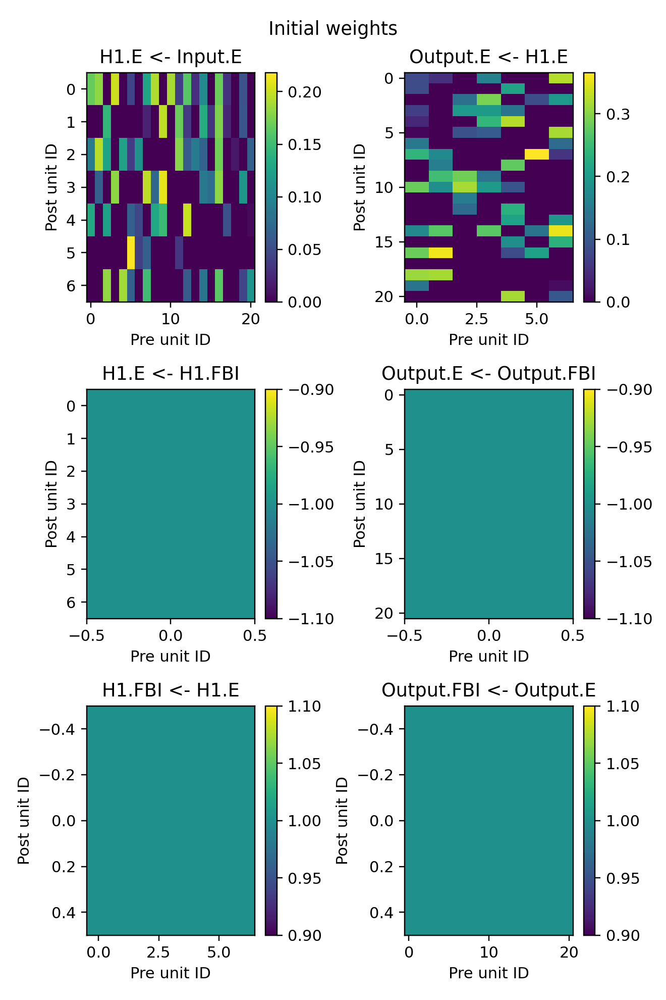

<IPython.core.display.Javascript object>


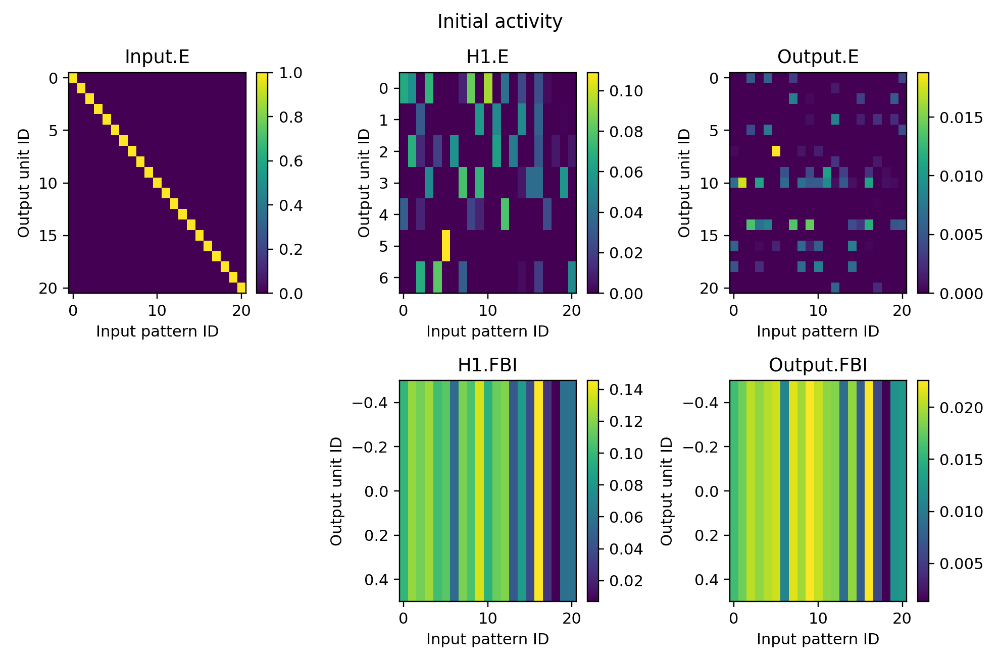

<IPython.core.display.Javascript object>


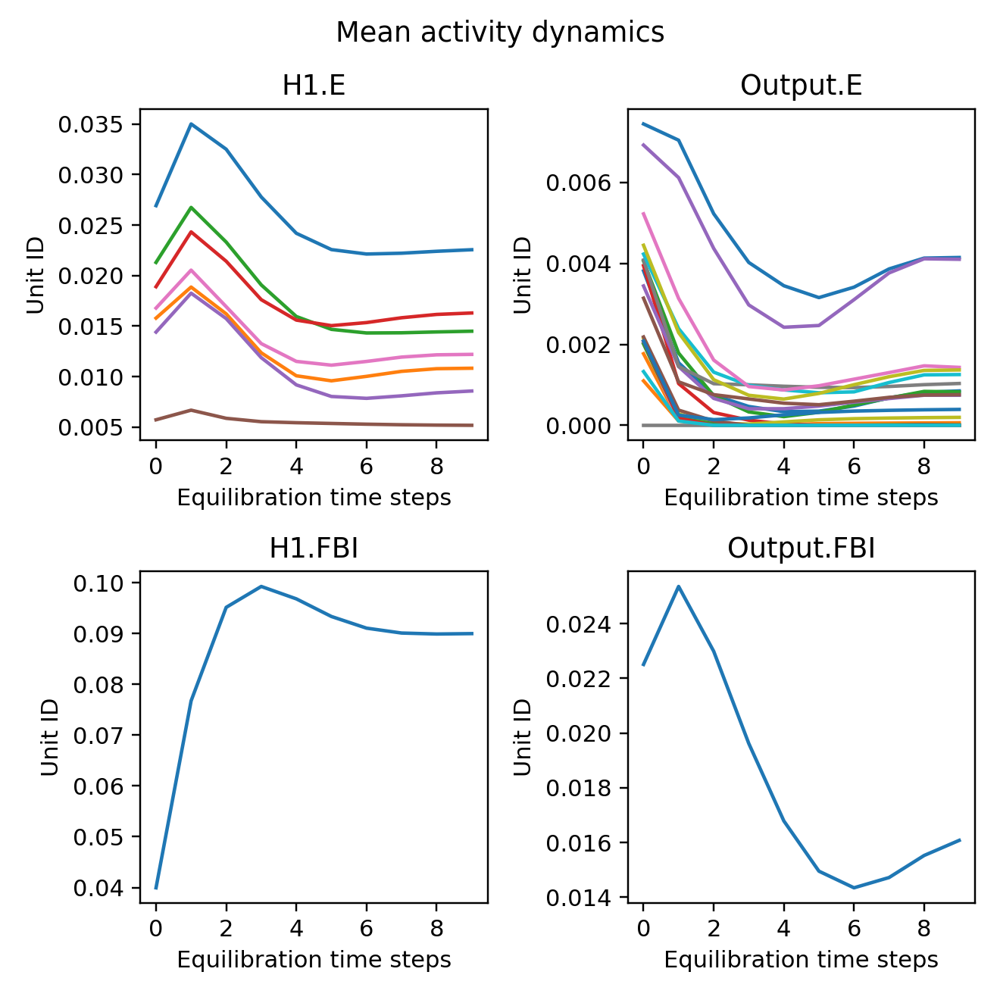

H1 E tensor([0., 0., 0., 0., 0., 0., 0.])
H1 FBI tensor([0.])
Output E tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Output FBI tensor([0.])


100%|██████████| 300/300 [00:16<00:00, 18.46it/s]


<IPython.core.display.Javascript object>


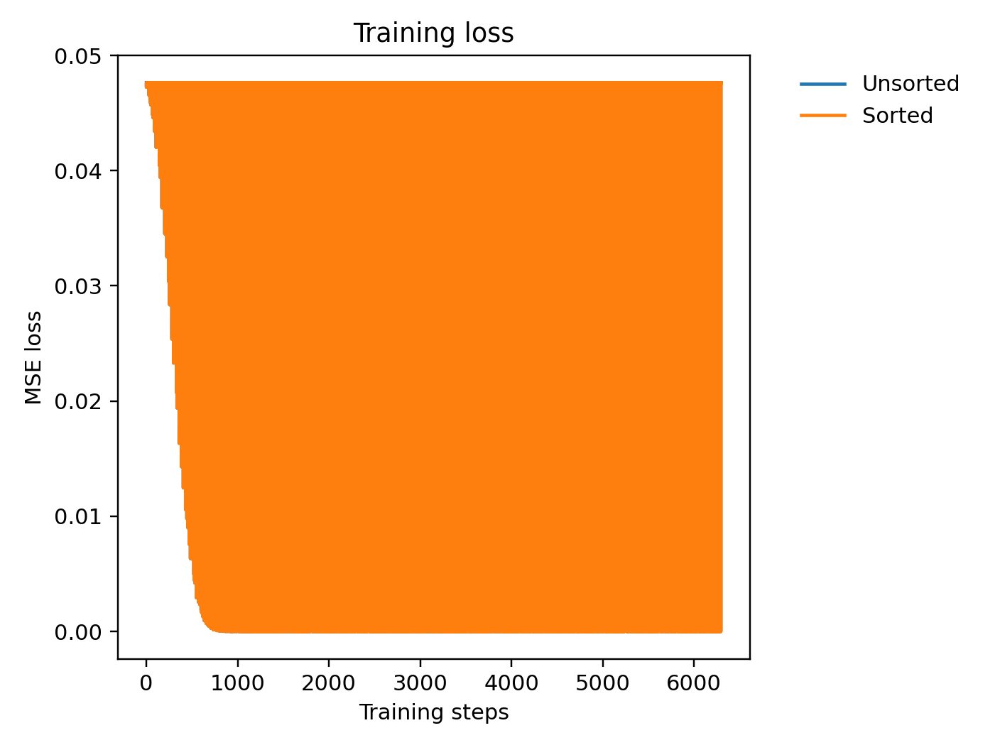

<IPython.core.display.Javascript object>


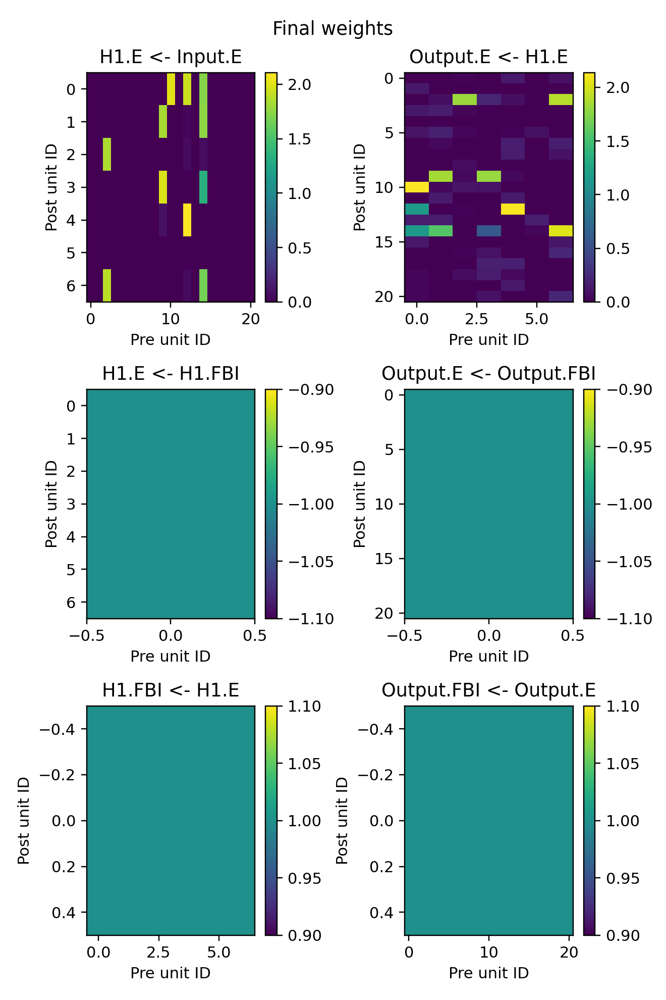

<IPython.core.display.Javascript object>


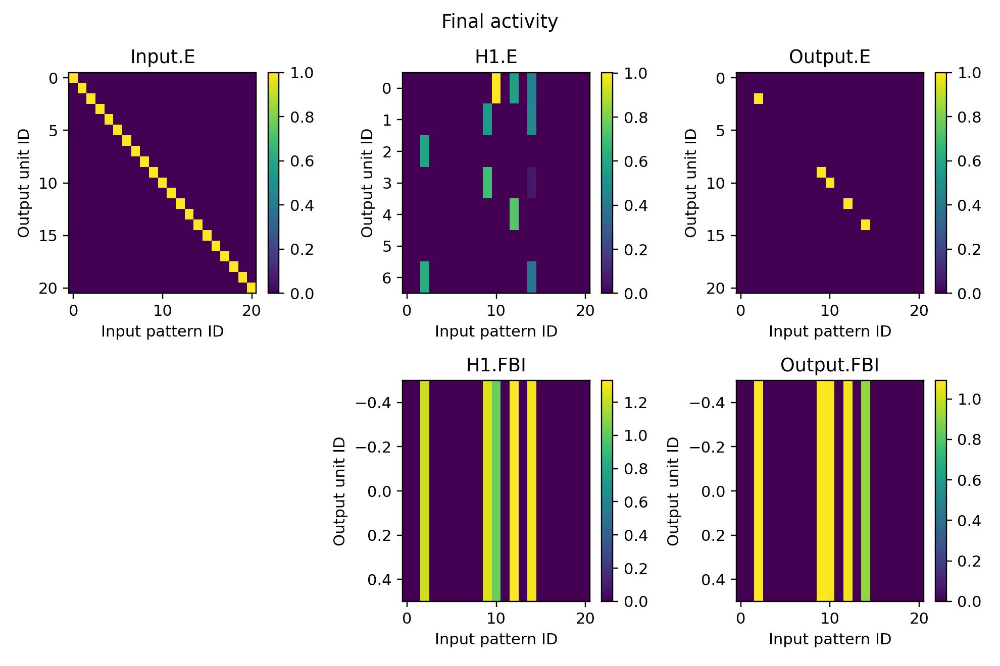

<IPython.core.display.Javascript object>


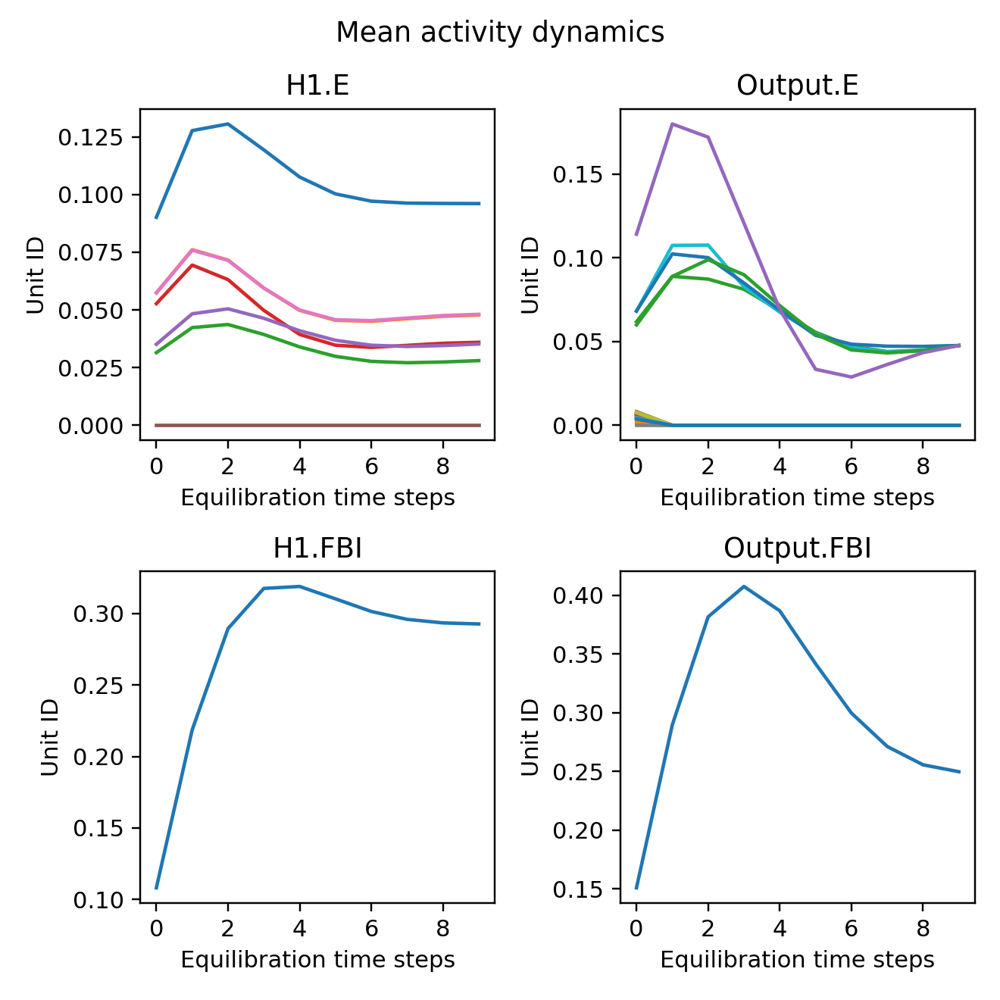

H1 E bias: tensor([0., 0., 0., 0., 0., 0., 0.])
H1 FBI bias: tensor([0.])
Output E bias: tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Output FBI bias: tensor([0.])


In [5]:
layer_config = {'Input': 
                    {'E': 
                         {'size': 21}
                    },
                'H1': 
                    {'E': 
                       {'size': 7, 
                        'activation': 'relu'
                       },
                    'FBI': 
                        {'size': 1, 
                        'activation': 'relu'
                        }
                    },
                'Output': 
                    {'E': 
                       {'size': 21, 
                        'activation': 'relu'
                       },
                    'FBI': 
                        {'size': 1, 
                        'activation': 'relu'
                        }
                    }
                 }

projection_config = {'H1':
                         {'E': 
                              {'Input': 
                                   {'E': 
                                        {'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'Backprop'
                                        }
                                   }, 
                               'H1': 
                                   {'FBI': 
                                        {'weight_init': 'fill_',
                                         'weight_init_args': (-1.,), 
                                         'direction': 'FB', 
                                         'learning_rule': None
                                        }
                                   }
                              },
                          'FBI': 
                              {'H1': 
                                   {'E': 
                                        {'weight_init': 'fill_',
                                         'weight_init_args': (1.,), 
                                         'direction': 'FF', 
                                         'learning_rule': None
                                        }
                                   }
                              }
                         },
                     'Output': 
                         {'E': 
                              {'H1': 
                                   {'E': 
                                        {'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'Backprop'
                                        }
                                   }, 
                               'Output': 
                                   {'FBI': 
                                        {'weight_init': 'fill_',
                                         'weight_init_args': (-1.,), 
                                         'direction': 'FB', 
                                         'learning_rule': None
                                        }
                                   }
                              },
                          'FBI': 
                              {'Output': 
                                   {'E': 
                                        {'weight_init': 'fill_',
                                         'weight_init_args': (1.,), 
                                         'direction': 'FF', 
                                         'learning_rule': None
                                        }
                                   }
                              }
                         }
                    }

hyperparameter_kwargs = {'tau': 3,
                         'forward_steps': 10,
                         'backward_steps': 2,
                         'learning_rate': 0.01,
                         'seed': 42,
                         'verbose': False
                        }

network = EIANN(layer_config, projection_config, **hyperparameter_kwargs, optimizer=Adam)
test_EIANN_config(network, dataset, target, epochs)

Backprop w/learned inhibition (softplus; Adam)

<IPython.core.display.Javascript object>


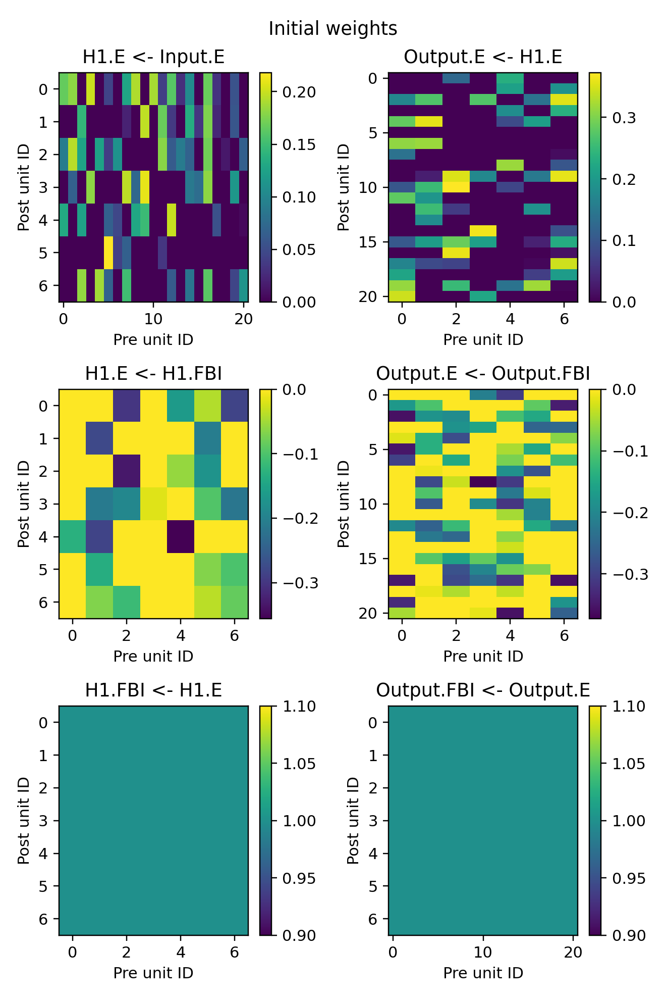

<IPython.core.display.Javascript object>


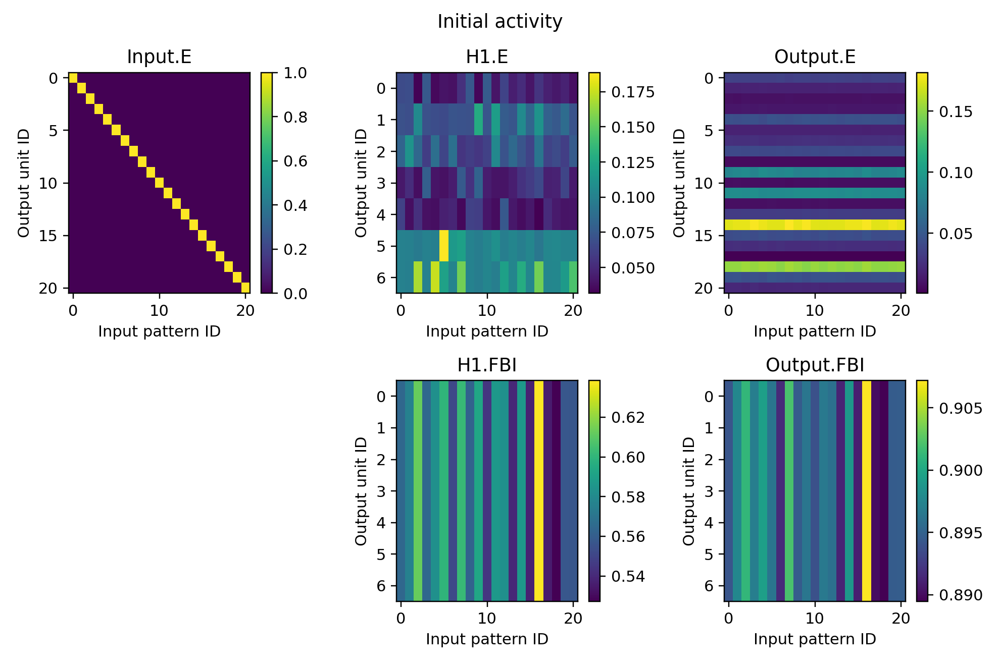

<IPython.core.display.Javascript object>


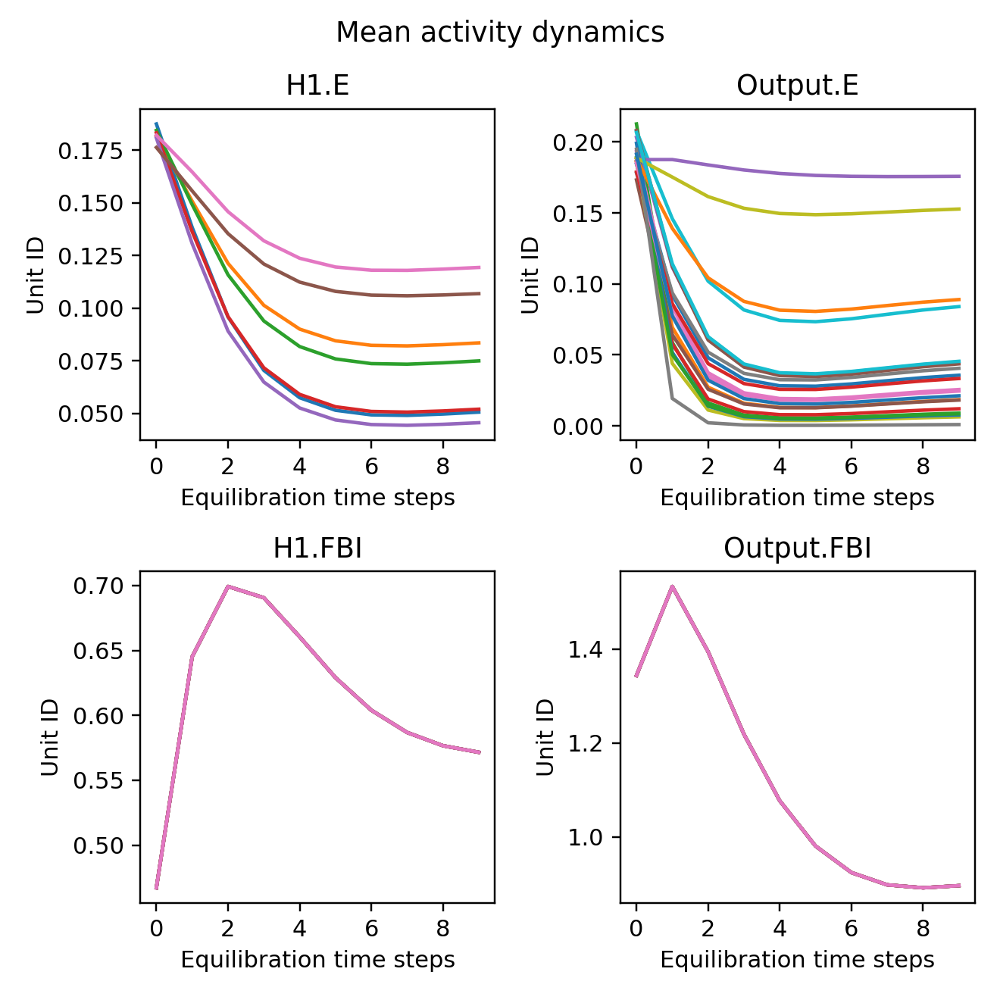

H1 E tensor([0., 0., 0., 0., 0., 0., 0.])
H1 FBI tensor([0., 0., 0., 0., 0., 0., 0.])
Output E tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Output FBI tensor([0., 0., 0., 0., 0., 0., 0.])


100%|██████████| 300/300 [00:14<00:00, 20.04it/s]


<IPython.core.display.Javascript object>


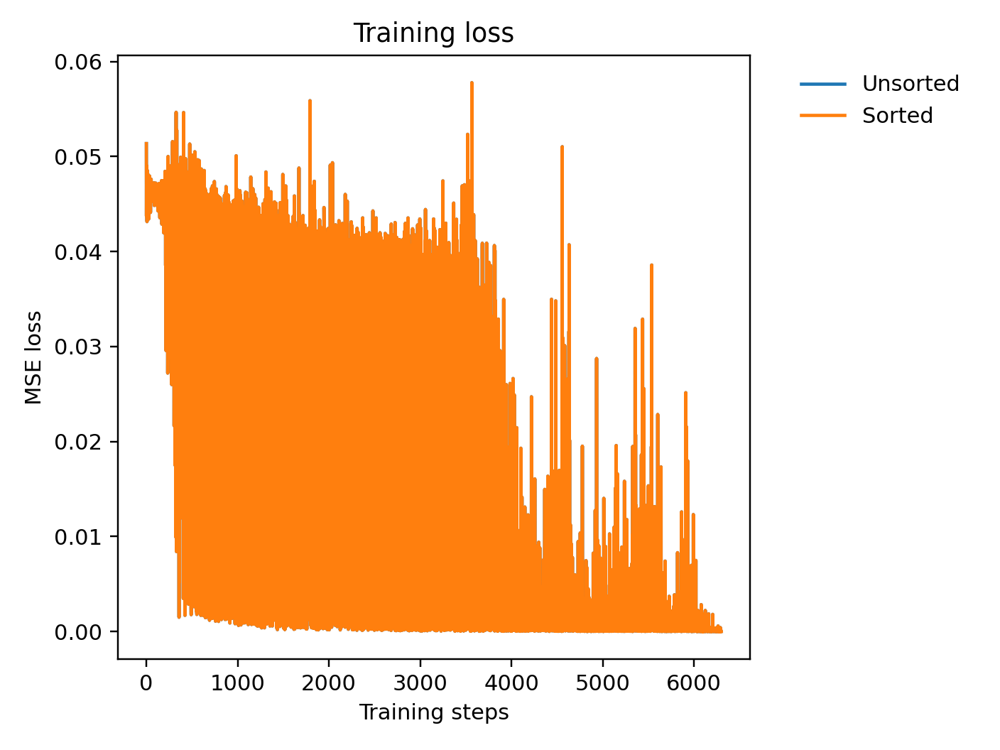

<IPython.core.display.Javascript object>


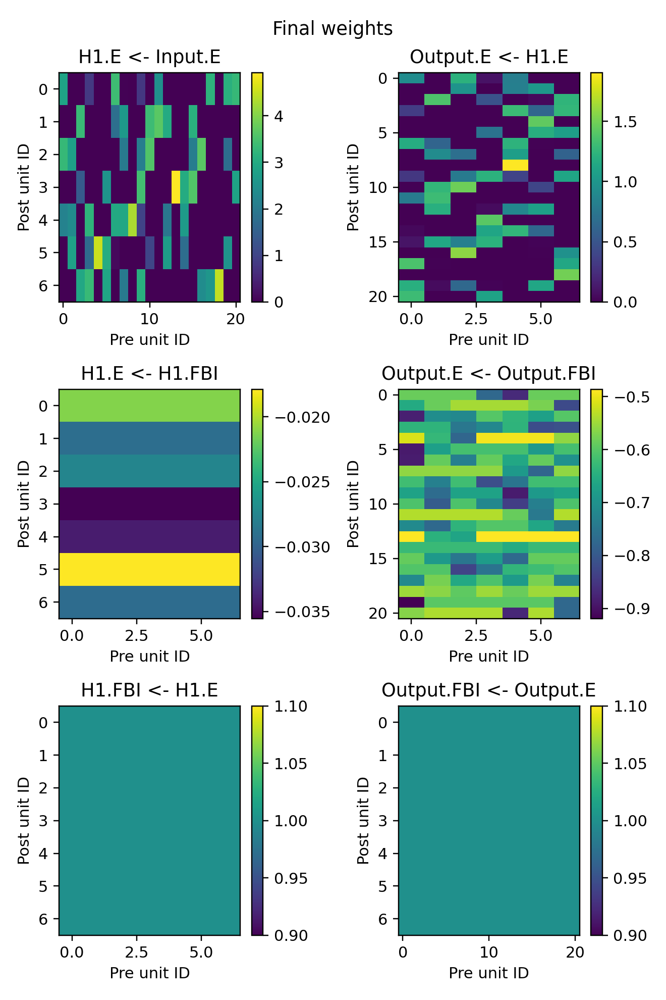

<IPython.core.display.Javascript object>


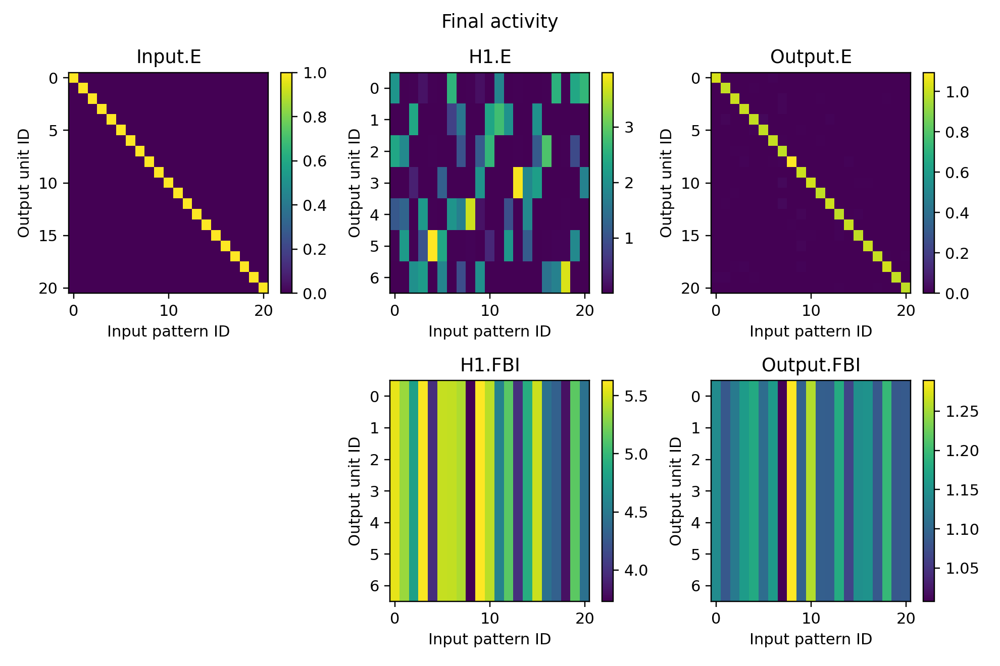

/Users/aaronmil/src/dentate_circuit_learning/EIANN_utils.py:288: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(max_rows, cols, figsize=(3. * cols, 3. * max_rows))


<IPython.core.display.Javascript object>


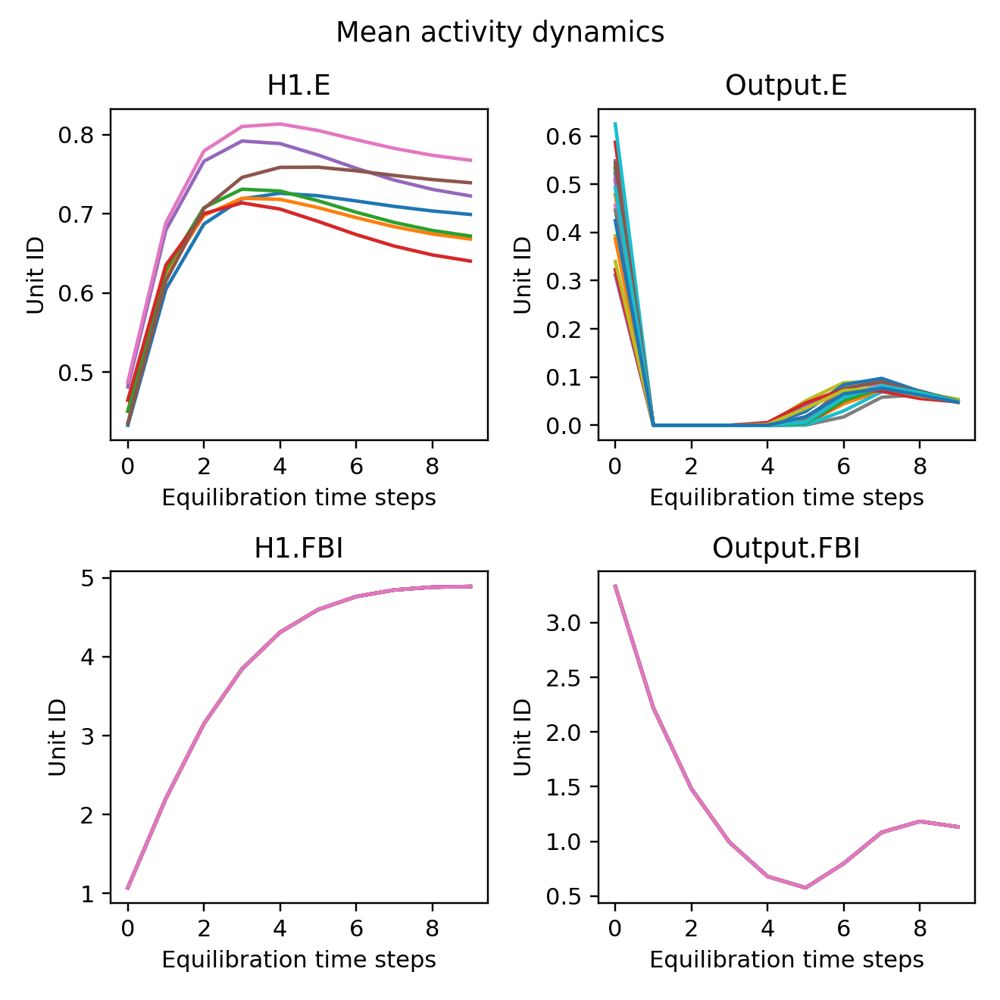

H1 E bias: tensor([0., 0., 0., 0., 0., 0., 0.])
H1 FBI bias: tensor([0., 0., 0., 0., 0., 0., 0.])
Output E bias: tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Output FBI bias: tensor([0., 0., 0., 0., 0., 0., 0.])


In [6]:
layer_config = {'Input': 
                    {'E': 
                         {'size': 21}
                    },
                'H1': 
                    {'E': 
                       {'size': 7, 
                        'activation': 'softplus', 
                        'activation_kwargs': 
                            {'beta': 4.}
                       },
                    'FBI': 
                        {'size': 7, 
                        'activation': 'softplus', 
                        'activation_kwargs': 
                            {'beta': 4.}
                        }
                    },
                'Output': 
                    {'E': 
                       {'size': 21, 
                        'activation': 'softplus', 
                        'activation_kwargs': 
                            {'beta': 4.}
                       },
                    'FBI': 
                        {'size': 7, 
                        'activation': 'softplus', 
                        'activation_kwargs': 
                            {'beta': 4.}
                        }
                    }
                 }

projection_config = {'H1':
                         {'E': 
                              {'Input': 
                                   {'E': 
                                        {'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'Backprop'
                                        }
                                   }, 
                               'H1': 
                                   {'FBI': 
                                        {'weight_bounds': (None, 0), 
                                         'direction': 'FB', 
                                         'learning_rule': 'Backprop'
                                        }
                                   }
                              },
                          'FBI': 
                              {'H1': 
                                   {'E': 
                                        {'weight_init': 'fill_',
                                         'weight_init_args': (1.,), 
                                         'direction': 'FF', 
                                         'learning_rule': None
                                        }
                                   }
                              }
                         },
                     'Output': 
                         {'E': 
                              {'H1': 
                                   {'E': 
                                        {'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'Backprop'
                                        }
                                   }, 
                               'Output': 
                                   {'FBI': 
                                        {'weight_bounds': (None, 0), 
                                         'direction': 'FB', 
                                         'learning_rule': 'Backprop'
                                        }
                                   }
                              },
                          'FBI': 
                              {'Output': 
                                   {'E': 
                                        {'weight_init': 'fill_',
                                         'weight_init_args': (1.,), 
                                         'direction': 'FF', 
                                         'learning_rule': None
                                        }
                                   }
                              }
                         }
                    }

hyperparameter_kwargs = {'tau': 3,
                         'forward_steps': 10,
                         'backward_steps': 2,
                         'learning_rate': 0.01,
                         'seed': 42,
                         'verbose': False
                        }

network = EIANN(layer_config, projection_config, **hyperparameter_kwargs, optimizer=Adam)
test_EIANN_config(network, dataset, target, epochs)

Gjorgieva Hebb Norm rule w/static inhibition (relu)

<IPython.core.display.Javascript object>


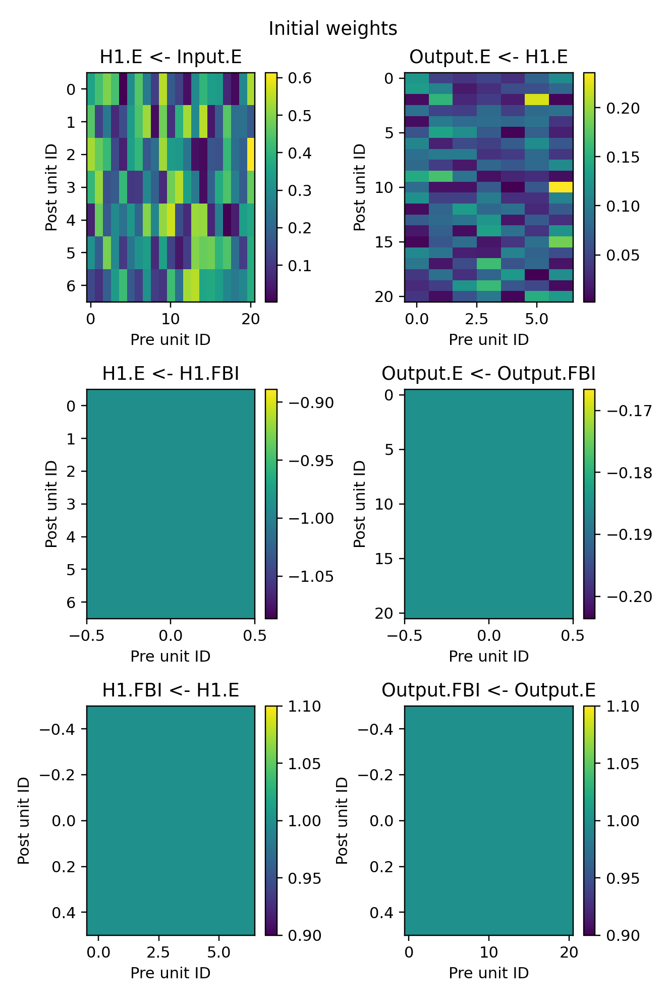

<IPython.core.display.Javascript object>


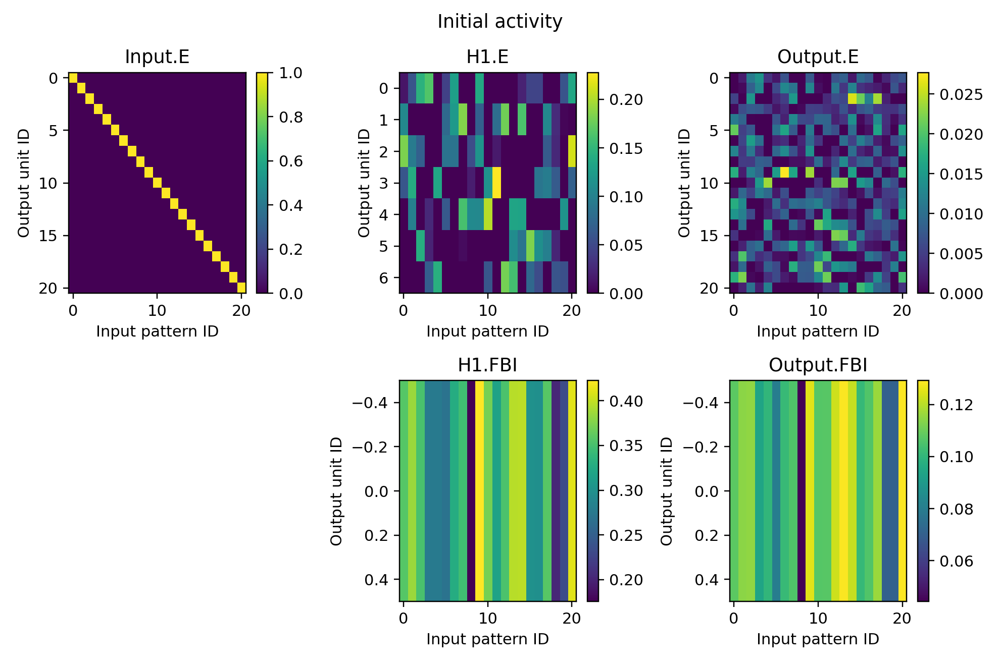

<IPython.core.display.Javascript object>


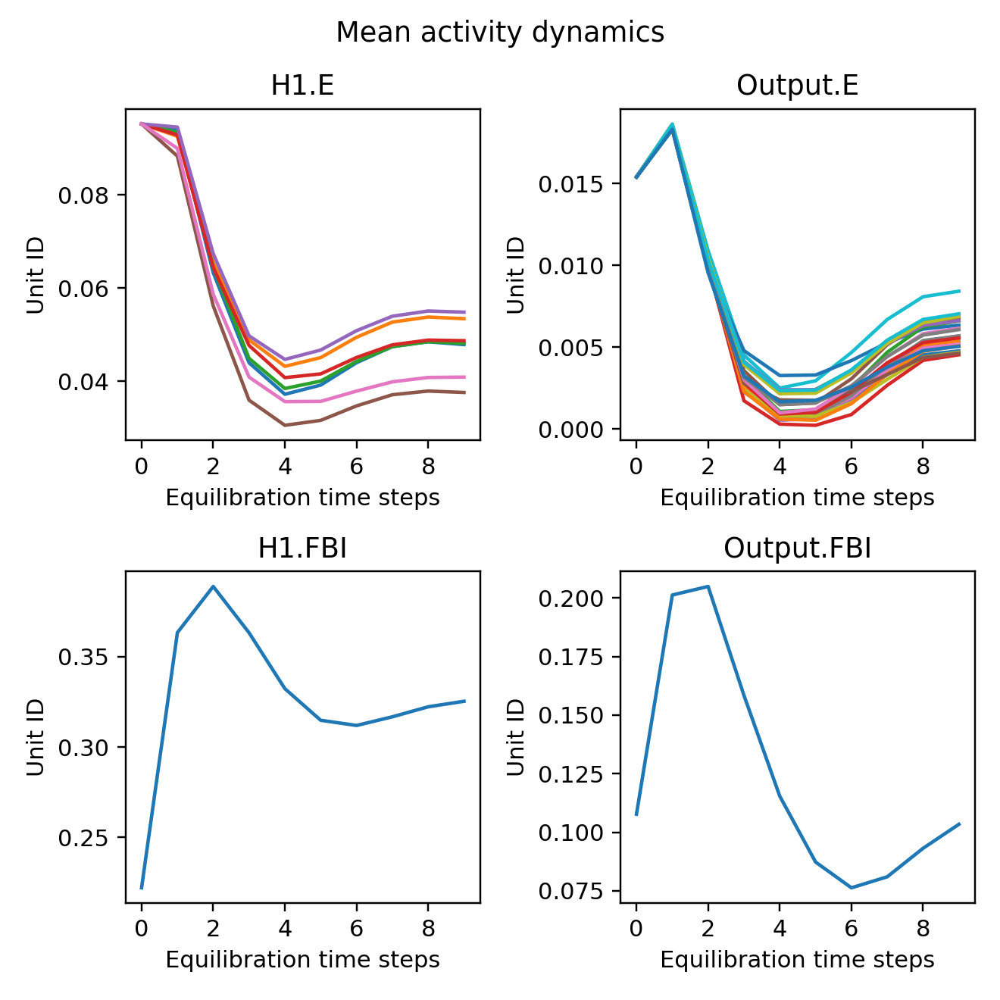

H1 E tensor([0., 0., 0., 0., 0., 0., 0.])
H1 FBI tensor([0.])
Output E tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Output FBI tensor([0.])


100%|██████████| 300/300 [00:17<00:00, 17.58it/s]


<IPython.core.display.Javascript object>


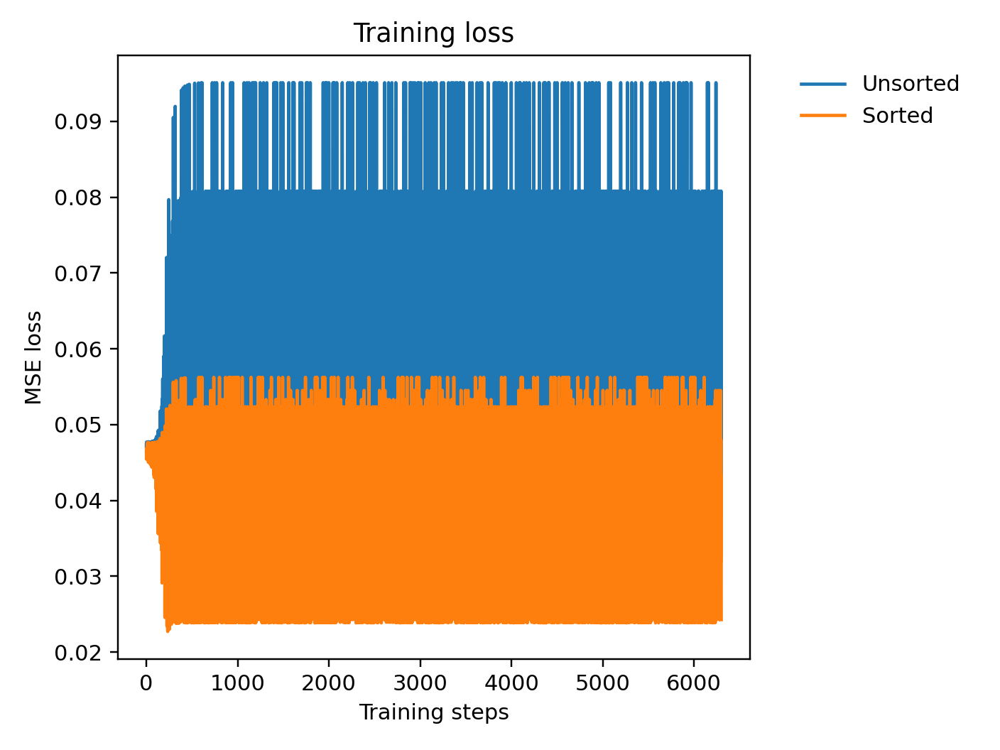

<IPython.core.display.Javascript object>


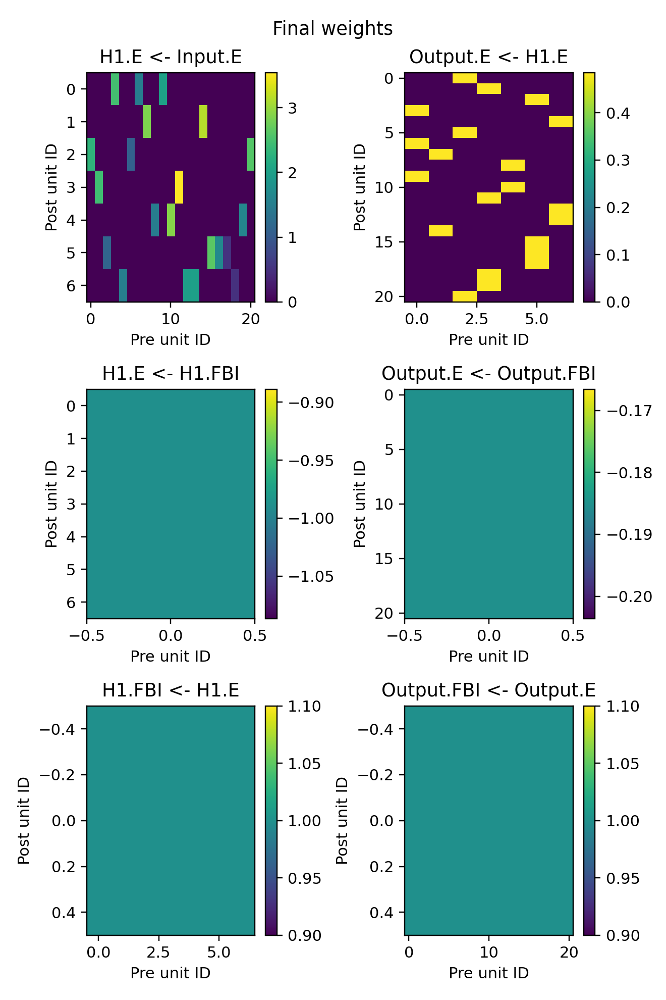

<IPython.core.display.Javascript object>


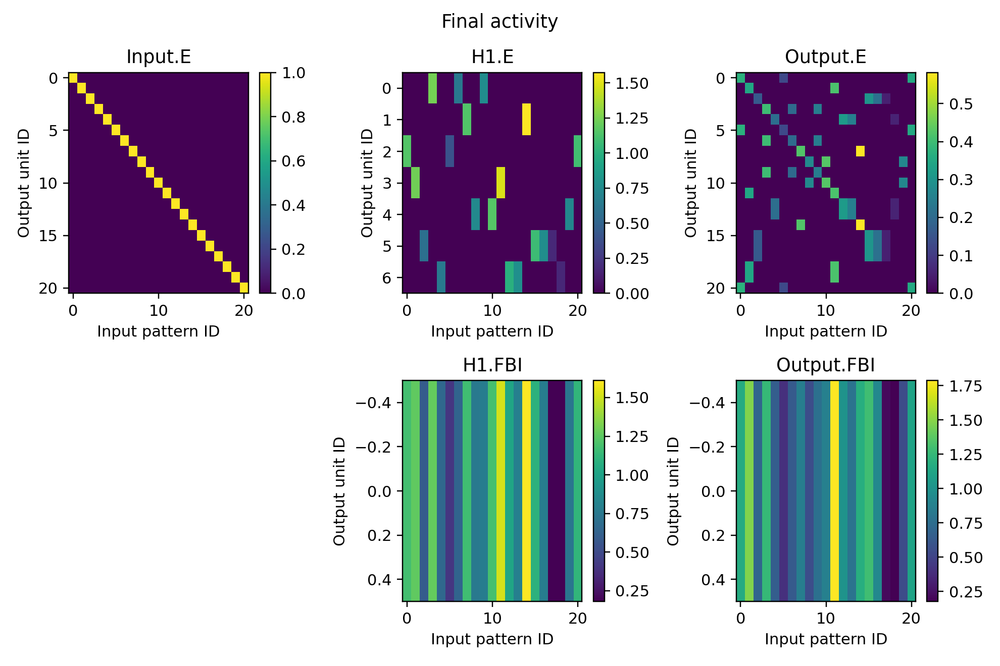

<IPython.core.display.Javascript object>


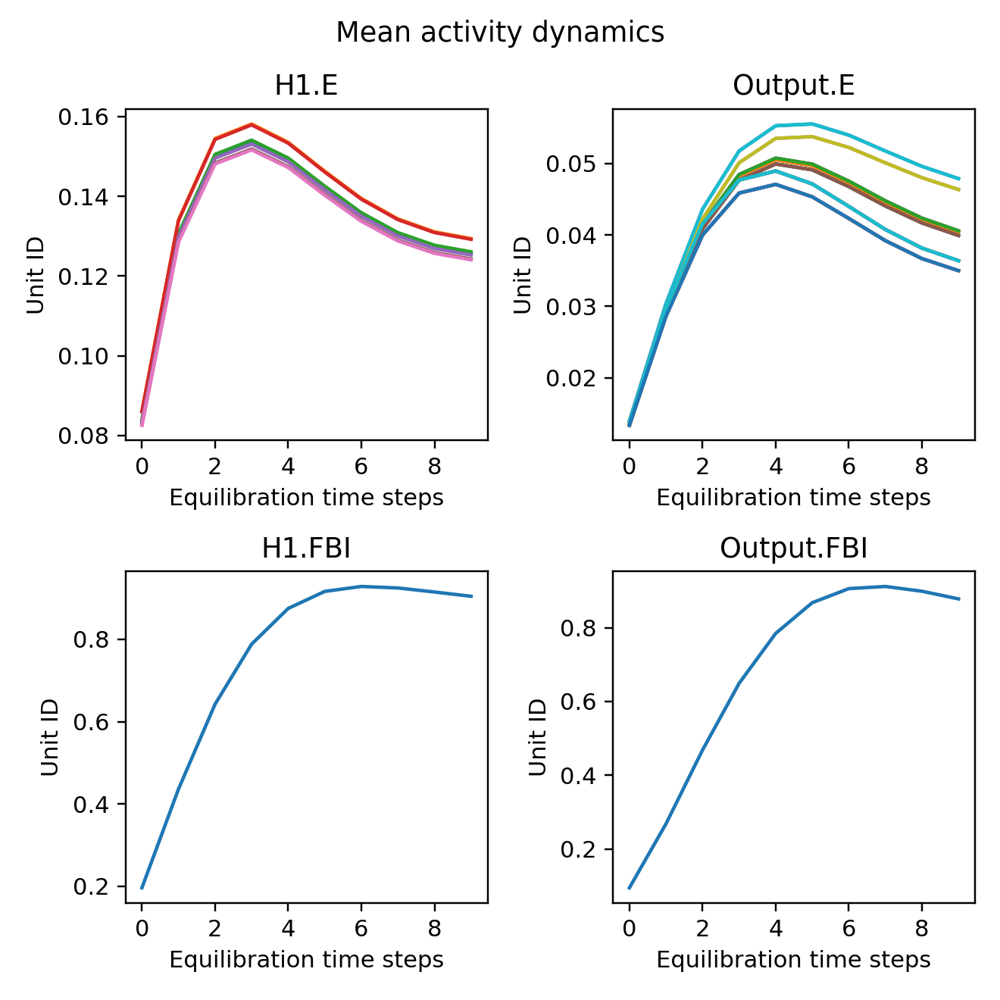

H1 E bias: tensor([0., 0., 0., 0., 0., 0., 0.])
H1 FBI bias: tensor([0.])
Output E bias: tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Output FBI bias: tensor([0.])


In [7]:
layer_config = {'Input': 
                    {'E': 
                         {'size': 21}
                    },
                'H1': 
                    {'E': 
                       {'size': 7, 
                        'activation': 'relu'
                       },
                    'FBI': 
                        {'size': 1, 
                        'activation': 'relu'
                        }
                    },
                'Output': 
                    {'E': 
                       {'size': 21, 
                        'activation': 'relu'
                       },
                    'FBI': 
                        {'size': 1, 
                        'activation': 'relu'
                        }
                    }
                 }

projection_config = {'H1':
                         {'E': 
                              {'Input': 
                                   {'E': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (0, 1), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 5.997826E+00
                                             },
                                         'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1
                                             }
                                        }
                                   }, 
                               'H1': 
                                   {'FBI': 
                                        {'weight_init': 'fill_', 
                                         'weight_init_args': (-9.877346E-01,), 
                                         'direction': 'FB', 
                                         'learning_rule': None
                                        }
                                   }
                              },
                          'FBI': 
                              {'H1': 
                                   {'E': 
                                        {'weight_init': 'fill_',
                                         'weight_init_args': (1.,), 
                                         'direction': 'FF', 
                                         'learning_rule': None
                                        }
                                   }
                              }
                         },
                      'Output': 
                         {'E': 
                              {'H1': 
                                   {'E': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (0, 1), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 4.849485E-01
                                             },
                                         'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1
                                             }
                                        }
                                   }, 
                               'Output': 
                                   {'FBI': 
                                        {'weight_init': 'fill_', 
                                         'weight_init_args': (-1.850915E-01,), 
                                         'direction': 'FB', 
                                         'learning_rule': None
                                        }
                                   }
                              },
                          'FBI': 
                              {'Output': 
                                   {'E': 
                                        {'weight_init': 'fill_', 
                                         'weight_init_args': (1,), 
                                         'direction': 'FF', 
                                         'learning_rule': None
                                        }
                                   }
                              }
                         }
                    }

hyperparameter_kwargs = {'tau': 3,
                         'forward_steps': 10,
                         'backward_steps': 0,
                         'learning_rate': 9.553728E-01,
                         'seed': 42
                        }

network = EIANN(layer_config, projection_config, **hyperparameter_kwargs)
test_EIANN_config(network, dataset, target, epochs)

Gjorgieva Hebb Norm rule w/learned inhibition (Gjorgieva Hebb Norm rule) (relu)

<IPython.core.display.Javascript object>


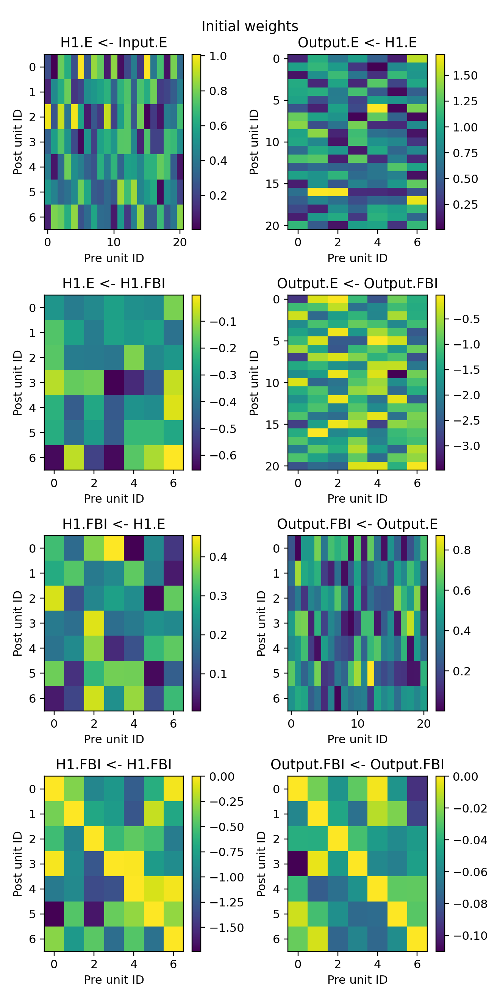

<IPython.core.display.Javascript object>


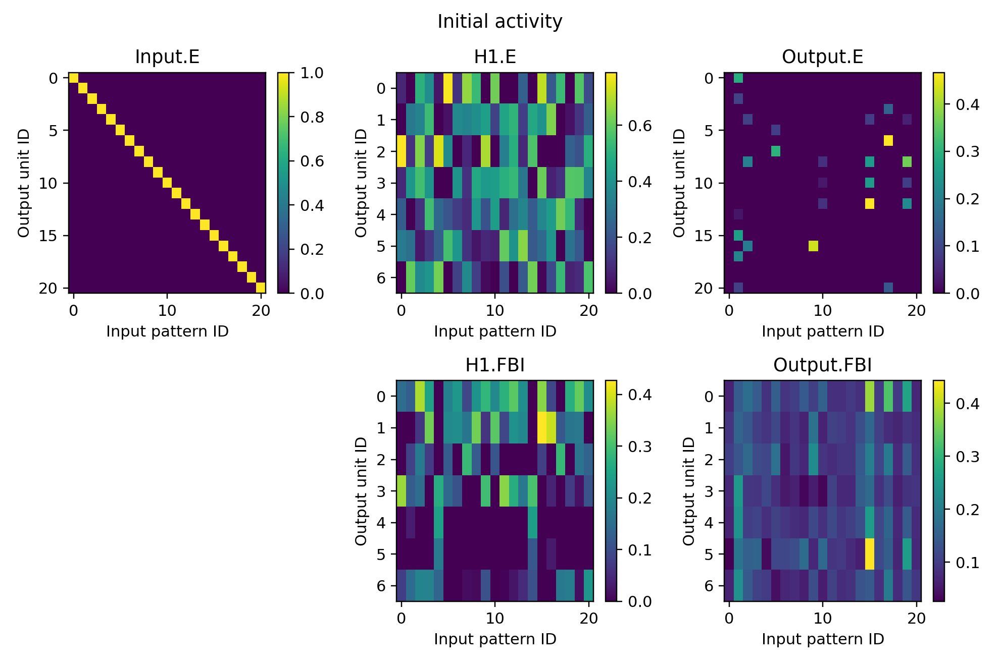

<IPython.core.display.Javascript object>


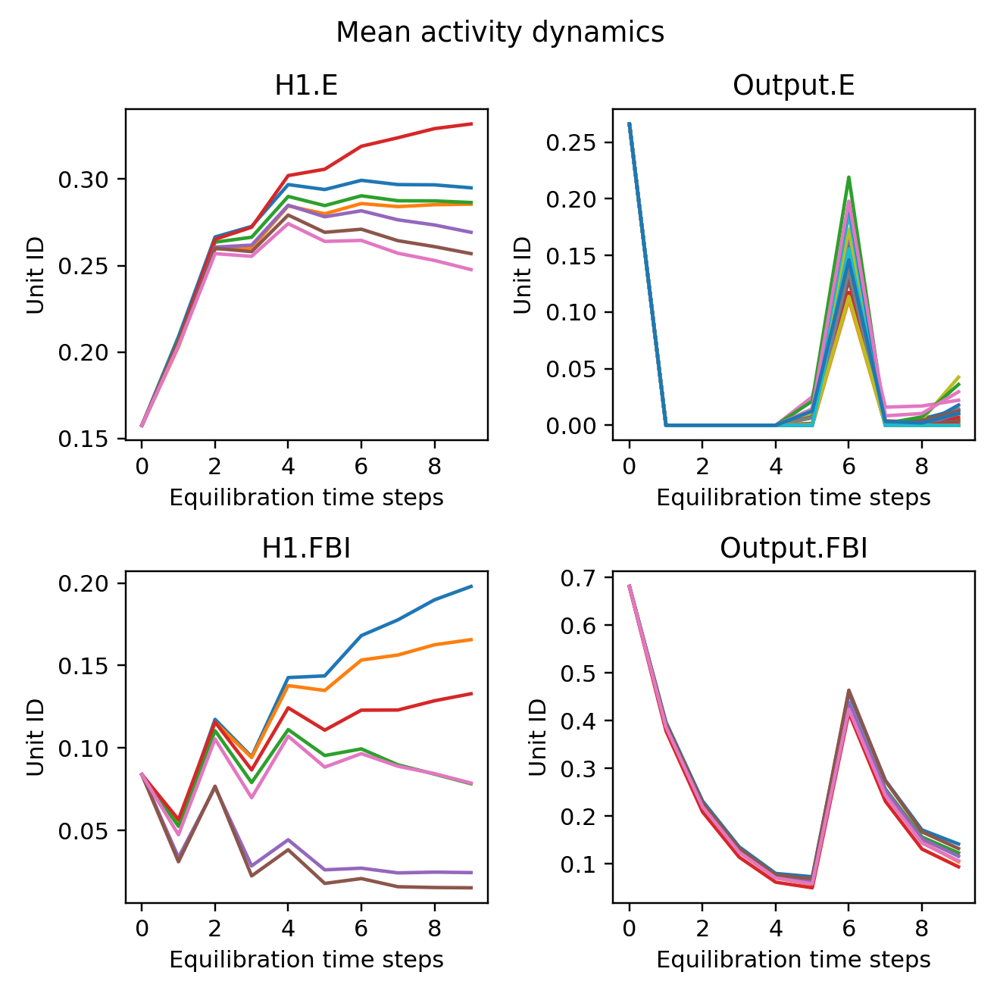

H1 E tensor([0., 0., 0., 0., 0., 0., 0.])
H1 FBI tensor([0., 0., 0., 0., 0., 0., 0.])
Output E tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Output FBI tensor([0., 0., 0., 0., 0., 0., 0.])


100%|██████████| 300/300 [00:15<00:00, 19.49it/s]


<IPython.core.display.Javascript object>


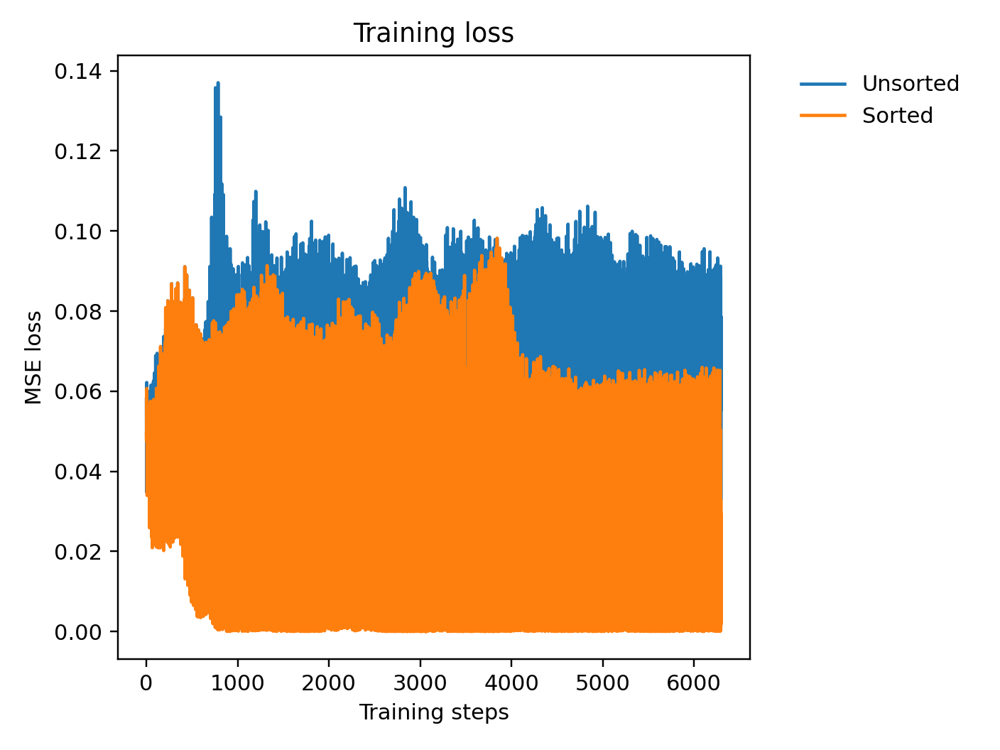

<IPython.core.display.Javascript object>


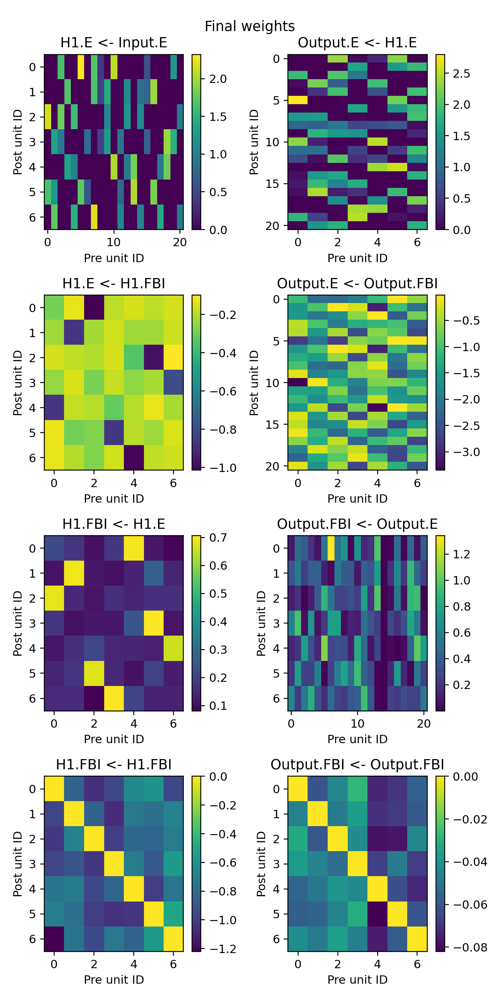

<IPython.core.display.Javascript object>


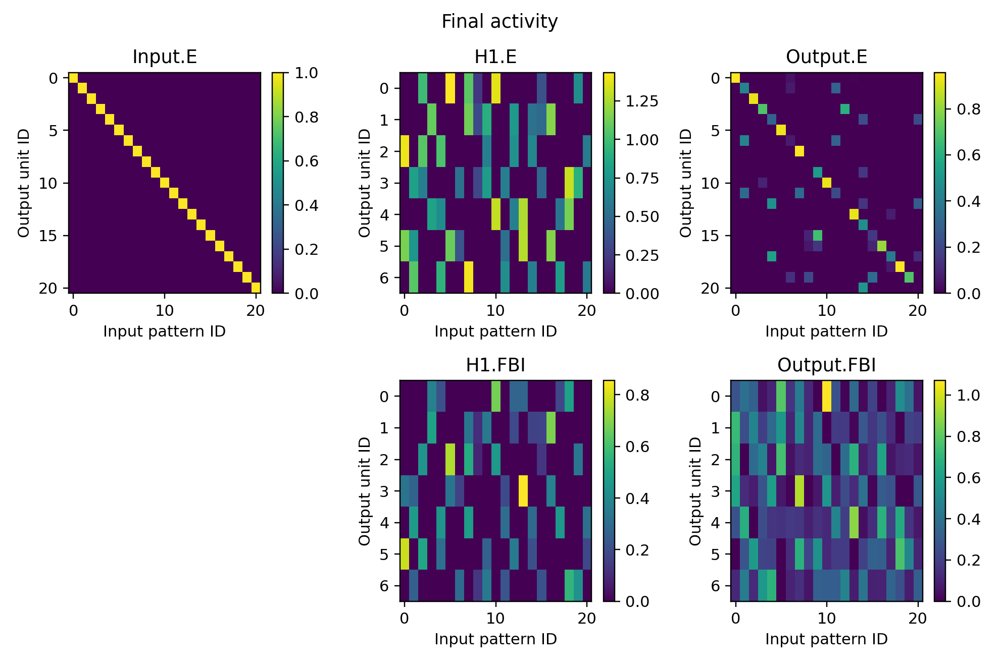

<IPython.core.display.Javascript object>


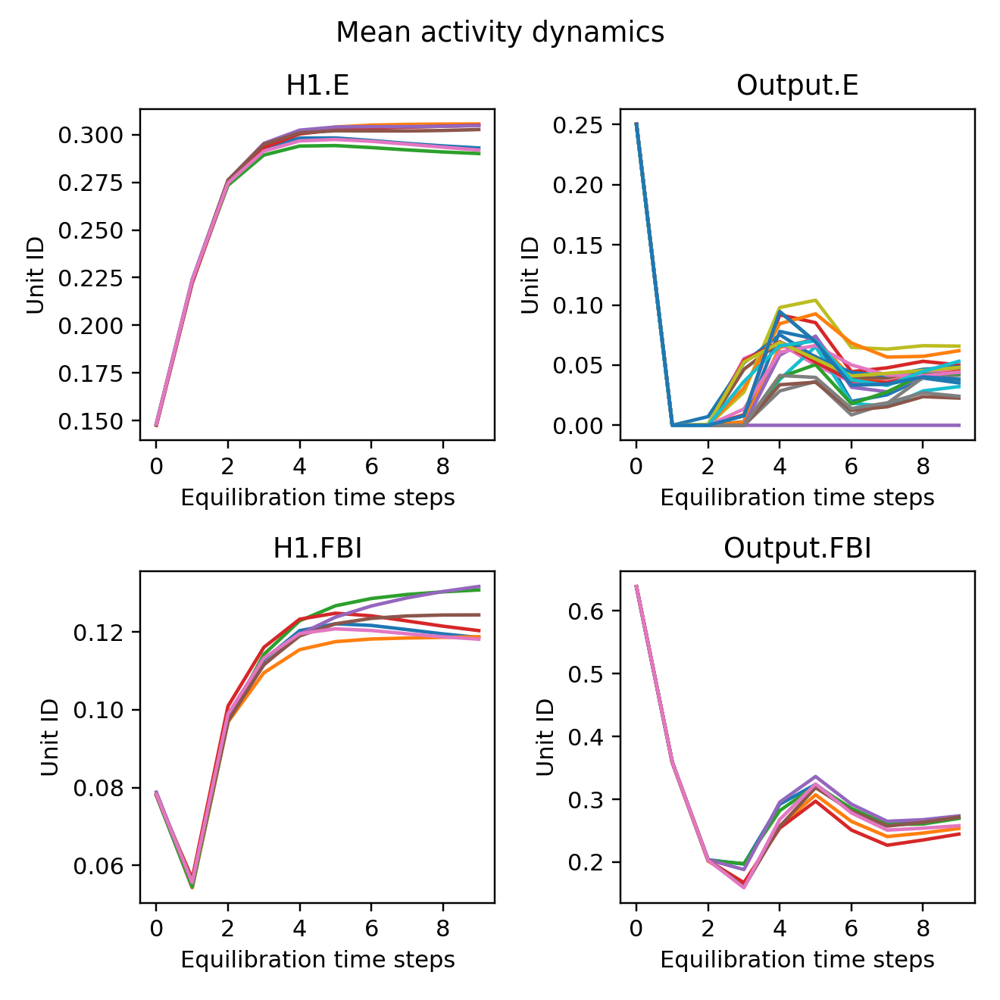

H1 E bias: tensor([0., 0., 0., 0., 0., 0., 0.])
H1 FBI bias: tensor([0., 0., 0., 0., 0., 0., 0.])
Output E bias: tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Output FBI bias: tensor([0., 0., 0., 0., 0., 0., 0.])


In [8]:
layer_config = {'Input': 
                    {'E': 
                         {'size': 21}
                    },
                'H1': 
                    {'E': 
                       {'size': 7, 
                        'activation': 'relu'
                       },
                    'FBI': 
                        {'size': 7, 
                        'activation': 'relu'
                        }
                    },
                'Output': 
                    {'E': 
                       {'size': 21, 
                        'activation': 'relu'
                       },
                    'FBI': 
                        {'size': 7, 
                        'activation': 'relu'
                        }
                    }
                 }

projection_config = {'H1':
                         {'E': 
                              {'Input': 
                                   {'E': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (0, 1), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 9.927103E+00
                                             },
                                         'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1,
                                              'learning_rate': 2.339308E-01
                                             }
                                        }
                                   }, 
                               'H1': 
                                   {'FBI': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (-1, 0), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 2.128817E+00
                                             },
                                         'weight_bounds': (None, 0), 
                                         'direction': 'FB', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': -1,
                                              'learning_rate': 2.023946E-01
                                             }
                                        }
                                   }
                              },
                          'FBI': 
                              {'H1': 
                                   {'E': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (0, 1), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 1.597438E+00
                                             },
                                         'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1,
                                              'learning_rate': 5.947580E-02
                                             }
                                        },
                                    'FBI': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (-1, 0), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 5.040185E+00
                                             },
                                         'weight_bounds': (None, 0), 
                                         'direction': 'FB', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': -1,
                                              'learning_rate': 2.982688E-01
                                             }
                                        }
                                   }
                              }
                         },
                      'Output': 
                         {'E': 
                              {'H1': 
                                   {'E': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (0, 1), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 5.066363E+00
                                             },
                                         'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1,
                                              'learning_rate': 2.339308E-01
                                             }
                                        }
                                   }, 
                               'Output': 
                                   {'FBI': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (-1, 0), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 9.054215E+00
                                             },
                                         'weight_bounds': (None, 0), 
                                         'direction': 'FB', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': -1,
                                              'learning_rate': 2.023946E-01
                                             }
                                        }
                                   }
                              },
                          'FBI': 
                              {'Output': 
                                   {'E': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (0, 1), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 7.679770E+00
                                             },
                                         'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1,
                                              'learning_rate': 5.947580E-02
                                             }
                                        },
                                    'FBI': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (-1, 0), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 3.343300E-01
                                             },
                                         'weight_bounds': (None, 0), 
                                         'direction': 'FB', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': -1,
                                              'learning_rate': 2.982688E-01
                                             }
                                        }
                                   }
                              }
                         }
                    }

hyperparameter_kwargs = {'tau': 3,
                         'forward_steps': 10,
                         'backward_steps': 0,
                         'learning_rate': 9.553728E-01,
                         'seed': 42
                        }

network = EIANN(layer_config, projection_config, **hyperparameter_kwargs)
test_EIANN_config(network, dataset, target, epochs)

Gjorgieva Hebb Norm rule w/learned inhibition (Gjorgieva Anti-Hebb Norm rule) (relu)

<IPython.core.display.Javascript object>


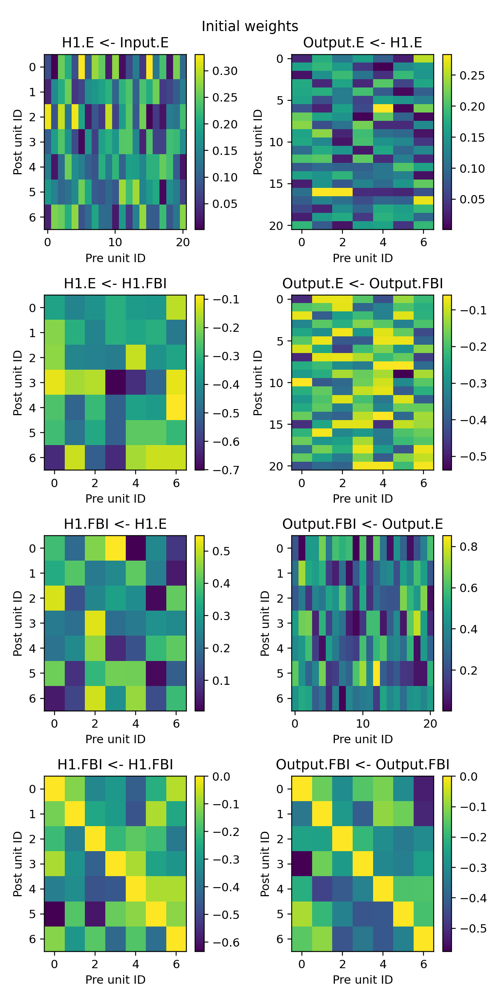

<IPython.core.display.Javascript object>


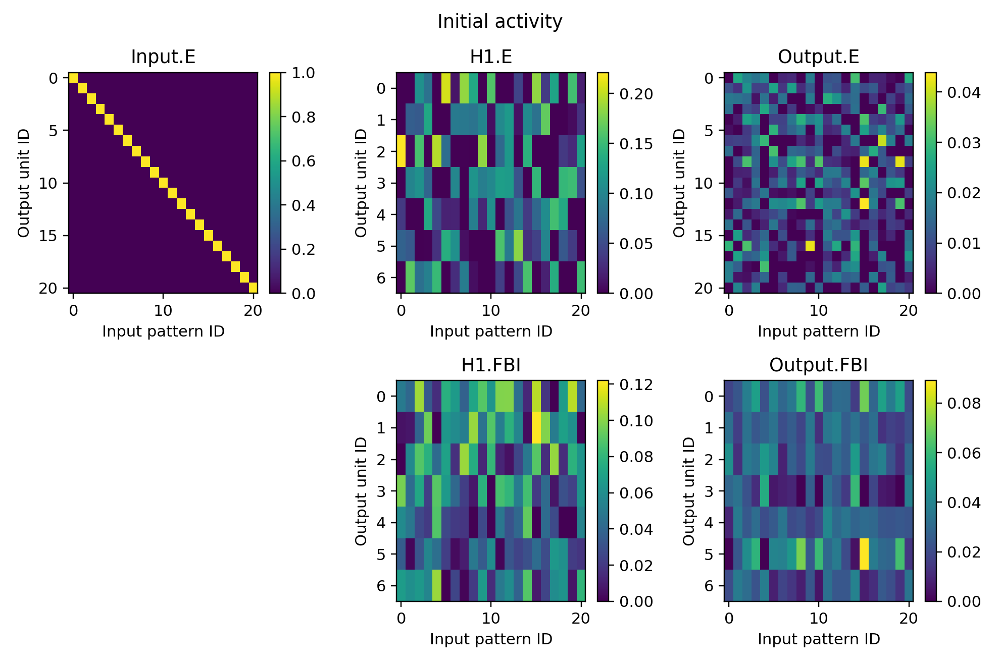

<IPython.core.display.Javascript object>


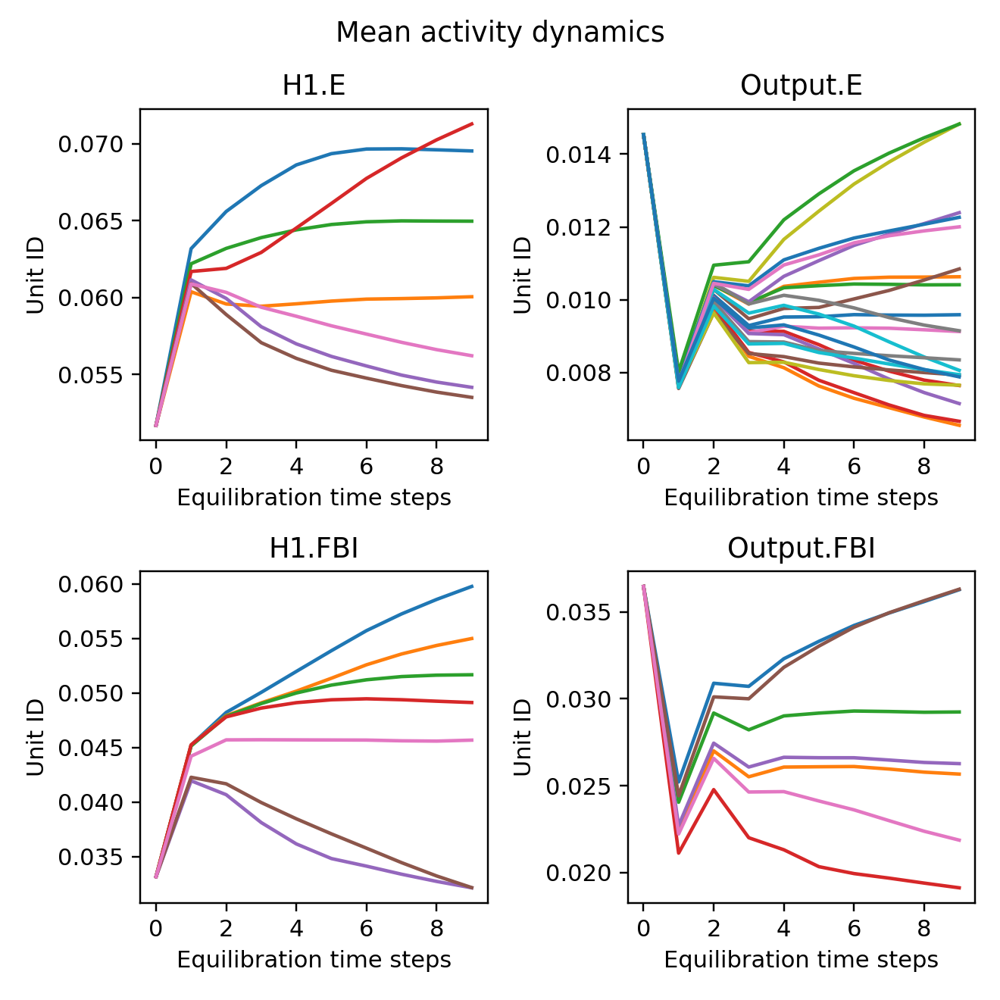

H1 E tensor([0., 0., 0., 0., 0., 0., 0.])
H1 FBI tensor([0., 0., 0., 0., 0., 0., 0.])
Output E tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Output FBI tensor([0., 0., 0., 0., 0., 0., 0.])


100%|██████████| 300/300 [00:15<00:00, 19.47it/s]


<IPython.core.display.Javascript object>


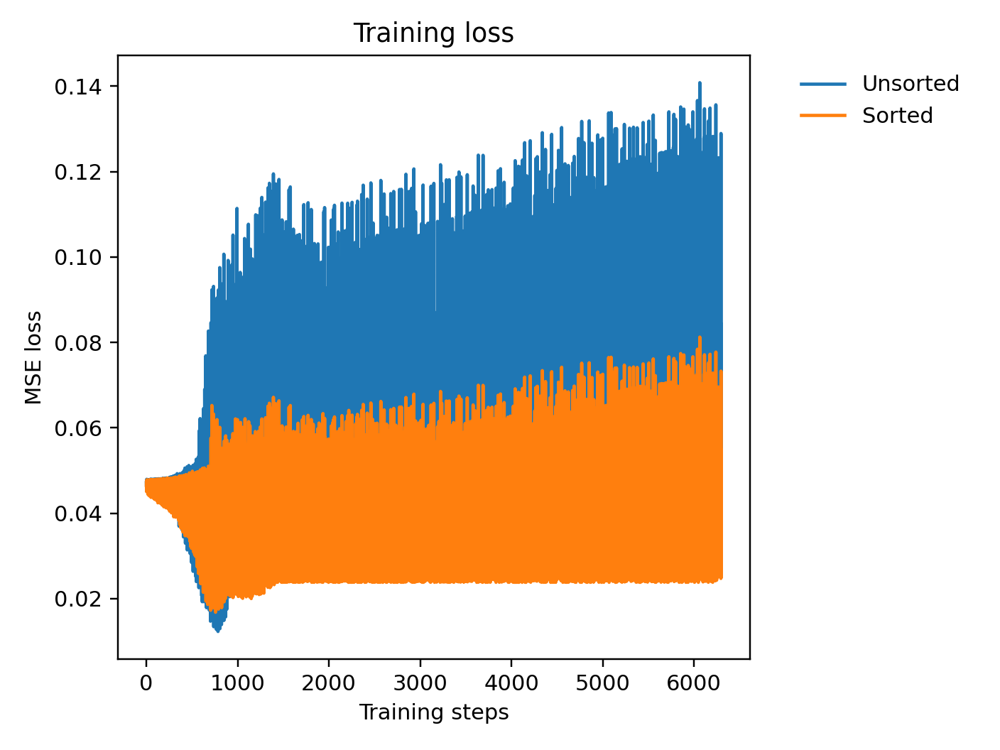

<IPython.core.display.Javascript object>


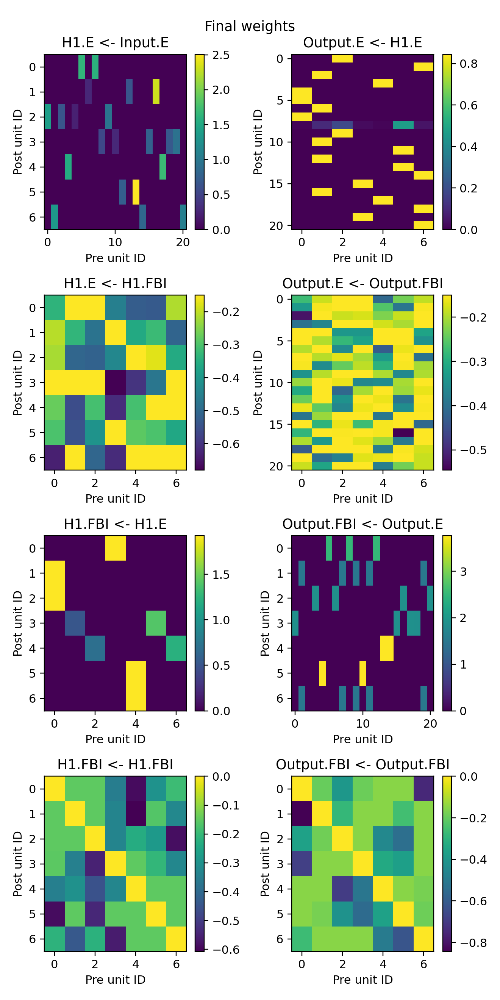

<IPython.core.display.Javascript object>


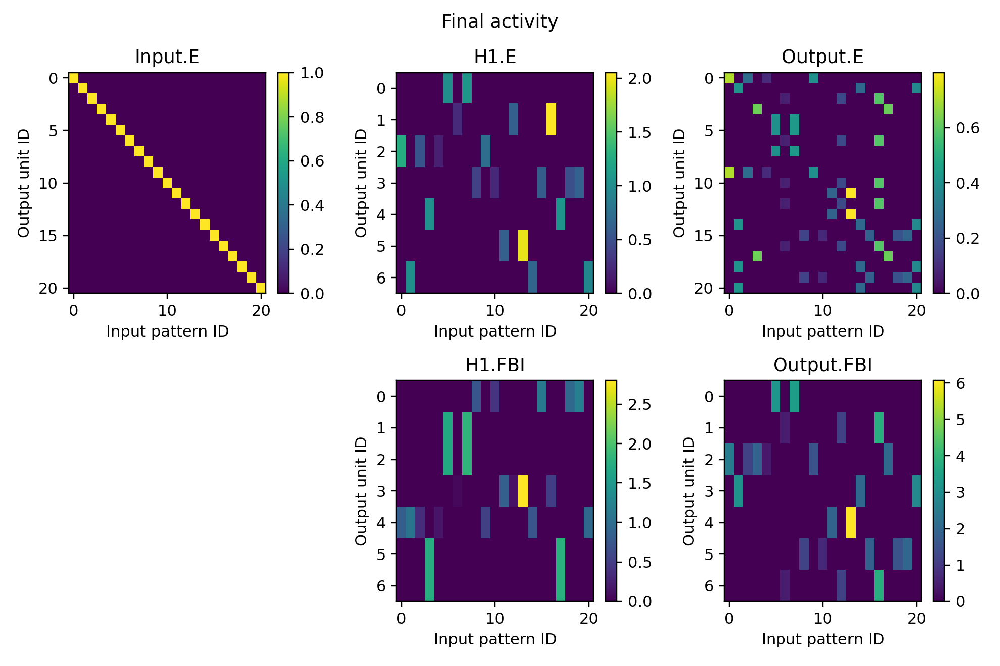

<IPython.core.display.Javascript object>


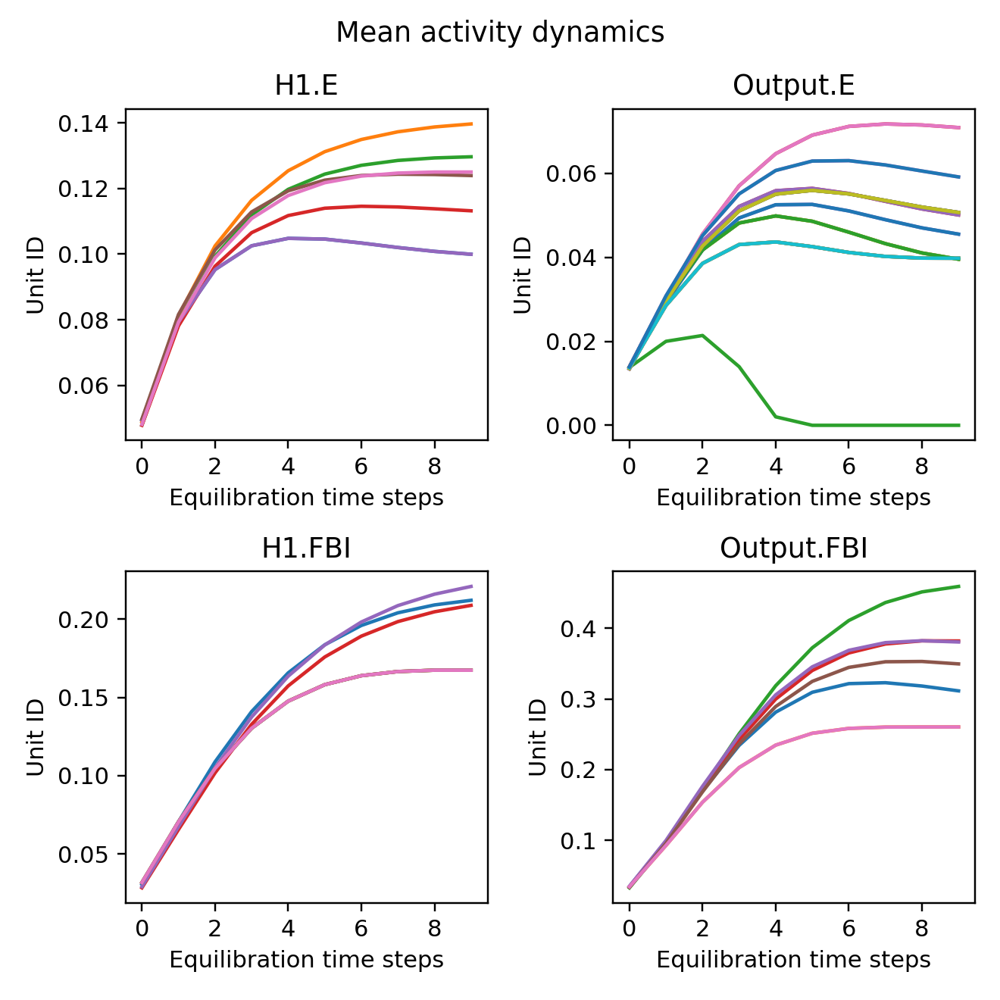

H1 E bias: tensor([0., 0., 0., 0., 0., 0., 0.])
H1 FBI bias: tensor([0., 0., 0., 0., 0., 0., 0.])
Output E bias: tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
Output FBI bias: tensor([0., 0., 0., 0., 0., 0., 0.])


In [9]:
layer_config = {'Input': 
                    {'E': 
                         {'size': 21}
                    },
                'H1': 
                    {'E': 
                       {'size': 7, 
                        'activation': 'relu'
                       },
                    'FBI': 
                        {'size': 7, 
                        'activation': 'relu'
                        }
                    },
                'Output': 
                    {'E': 
                       {'size': 21, 
                        'activation': 'relu'
                       },
                    'FBI': 
                        {'size': 7, 
                        'activation': 'relu'
                        }
                    }
                 }

projection_config = {'H1':
                         {'E': 
                              {'Input': 
                                   {'E': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (0, 1), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 3.255803E+00
                                             },
                                         'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1,
                                              'learning_rate': 2.756839E-01
                                             }
                                        }
                                   }, 
                               'H1': 
                                   {'FBI': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (-1, 0), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 2.352644E+00
                                             },
                                         'weight_bounds': (None, -0.15), 
                                         'direction': 'FB', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1,
                                              'learning_rate': 1.415294E-02
                                             }
                                        }
                                   }
                              },
                          'FBI': 
                              {'H1': 
                                   {'E': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (0, 1), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 1.925080E+00
                                             },
                                         'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1,
                                              'learning_rate': 3.213503E-01
                                             }
                                        },
                                    'FBI': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (-1, 0), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 1.877143E+00
                                             },
                                         'weight_bounds': (None, -0.15), 
                                         'direction': 'FB', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1,
                                              'learning_rate': 4.600147E-02
                                             }
                                        }
                                   }
                              }
                         },
                      'Output': 
                         {'E': 
                              {'H1': 
                                   {'E': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (0, 1), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 8.436103E-01
                                             },
                                         'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1,
                                              'learning_rate': 2.756839E-01
                                             }
                                        }
                                   }, 
                               'Output': 
                                   {'FBI': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (-1, 0), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 1.589356E+00
                                             },
                                         'weight_bounds': (None, -0.15), 
                                         'direction': 'FB', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1,
                                              'learning_rate': 1.415294E-02
                                             }
                                        }
                                   }
                              },
                          'FBI': 
                              {'Output': 
                                   {'E': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (0, 1), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 7.526584E+00
                                             },
                                         'weight_bounds': (0, None), 
                                         'direction': 'FF', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1,
                                              'learning_rate': 3.213503E-01
                                             }
                                        },
                                    'FBI': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (-1, 0), 
                                         'weight_constraint': 'normalize_weight',
                                         'weight_constraint_kwargs': 
                                             {'scale': 1.979838E+00
                                             },
                                         'weight_bounds': (None, -0.15), 
                                         'direction': 'FB', 
                                         'learning_rule': 'GjorgievaHebb',
                                         'learning_rule_kwargs': 
                                             {'sign': 1,
                                              'learning_rate': 4.600147E-02
                                             }
                                        }
                                   }
                              }
                         }
                    }

hyperparameter_kwargs = {'tau': 3,
                         'forward_steps': 10,
                         'backward_steps': 0,
                         'learning_rate': 9.553728E-01,
                         'seed': 42
                        }

network = EIANN(layer_config, projection_config, **hyperparameter_kwargs)
test_EIANN_config(network, dataset, target, epochs)

BTSP rule w/static somatic inhibition (relu) - NOT YET IMPLEMENTED

In [ ]:
layer_config = {'Input': 
                      {'E': 
                           {'size': 7}}, 
                'Output': 
                      {'E': 
                           {'size': 21, 
                            'activation': 'relu'
                           },
                       'FBI': 
                            {'size': 1, 
                            'activation': 'relu'
                            }
                      }
                 }

projection_config = {'Output': 
                         {'E': 
                              {'Input': 
                                   {'E': 
                                        {'weight_init': 'uniform_', 
                                         'weight_init_args': (0, 0.07147848847421427), 
                                         'weight_bounds': (0, 4.998271E+00), 
                                         'direction': 'FF', 
                                         'learning_rule': 'BTSP'
                                        }
                                   }, 
                               'Output': 
                                   {'FBI': 
                                        {'weight_init': 'fill_', 
                                         'weight_init_args': (-1.484698E+00,), 
                                         'direction': 'FB', 
                                         'learning_rule': None,
                                        }
                                   }
                              },
                          'FBI': 
                              {'Output': 
                                   {'E': 
                                        {'weight_init': 'fill_', 
                                         'weight_init_args': (1,), 
                                         'direction': 'FF', 
                                         'learning_rule': None,
                                        }
                                   }
                              }
                         }
                    }

hyperparameter_kwargs = {'tau': 3,
                         'forward_steps': 10,
                         'backward_steps': 0,
                         'learning_rate': 2.426774E-01,
                         'seed': 42
                        }

network = EIANN(layer_config, projection_config, **hyperparameter_kwargs)
test_EIANN_config(network, dataset, target, epochs)